In [144]:
# !pip install tweet-preprocessor
# !pip install emot


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import json
import re
import os, pickle
import ast
import datetime
import math,string
import warnings
warnings.filterwarnings('ignore')

import nltk
from textblob import TextBlob as tb
import gensim

# nltk.download('stopwords')
# nltk.download('punkt')
# nltk.download('wordnet')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('words')
from nltk.corpus import wordnet 
from nltk.corpus import stopwords 
from nltk.corpus import words
from nltk.stem import WordNetLemmatizer


import preprocessor as p
from emot import UNICODE_EMO,EMOTICONS
from wordcloud import WordCloud
from PIL import Image
from pandas.plotting import table 

In [3]:
df = pd.read_csv('data/sample_tweets.csv',lineterminator='\n')
df.columns = list(df.columns[:-1])+['text']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150889 entries, 0 to 150888
Data columns (total 11 columns):
id                       150889 non-null int64
weekday                  150889 non-null object
date                     150889 non-null object
time                     150889 non-null object
in_reply_to_status_id    9018 non-null float64
quoted_status_id         48975 non-null float64
country_code             582 non-null object
retweet_count            150889 non-null int64
hashtags                 150889 non-null object
lang                     150889 non-null object
text                     150889 non-null object
dtypes: float64(2), int64(2), object(7)
memory usage: 12.7+ MB


# Text Analysis

In [156]:
df.groupby('lang').count().sort_values('id',ascending=False).loc['en','id']/150889 

0.7198470398769957

In [282]:
df.drop_duplicates('id').shape

(150889, 11)

In [4]:
df_en_tweet = df[df.lang=='en'][['id','text']]
df_no_en_tweet = df[df.lang!='en'][['id','text']]
df_en_tweet.head()

,id,text
0,1176408764590829570,Fringe practicing wanton destruction for destr...
1,1176408776959643648,In this battle between democracy versus dictat...
3,1176408806890147840,If this #VascoWilliams guy isn’t unemployed in...
4,1176408832714559489,I cosponsored the #HongKongHumanRightsAndDemoc...
5,1176408868395479042,"Also when #HKPolice say ""nothing is more impor..."


In [153]:
df_en_tweet.shape

(108617, 2)

## WordCloud

df_wc_tweet: sample tweet for word cloud.p

In [660]:
stop_words = set(stopwords.words('english'))
   
def check_phrase_in_list(phrase,word_list):
    for word in word_list:
        if word in phrase:
            return True
    return False

def generate_word_cloud(all_words,file_name='',bigram=True,re_color=False):
    mask = np.array(Image.open("data/hkmap.png"))
    
    font_path = os.path.join('word-cloud-font-library/','RuiZiYun.TTF')
#     'HuaWenXinWei.ttf' 
#     'chinese.simfang.ttf'

    wordcloud = WordCloud(collocations=bigram, font_path=font_path,width=2000,height=1000,
                          background_color='white',mask=mask,max_words=1000,stopwords=stop_words)
    wordcloud.generate(' '.join(all_words))
    
    if re_color:
        wordcloud.recolor(color_func=grouped_color_func)


    figure = plt.figure(figsize=(10,8))
    
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    if file_name != '':
        save_path = os.path.join('word-cloud-image/',file_name)
        plt.savefig(save_path,dpi=300)
    plt.show()


In [543]:
df_wc_tweet = pickle.load(open('data/sample tweet for word cloud.p','rb'))
df_wc_tweet.head()

,id,text,clean_tweets,noun_phrases,without_hashtags,without_hashtags_noun_phrases
0,1176408764590829570,Fringe practicing wanton destruction for destr...,fringe practice wanton destruction for destruc...,"[fringe practice wanton destruction, destructi...",fringe practice wanton destruction for destruc...,"[fringe practice wanton destruction, destructi..."
1,1176408776959643648,In this battle between democracy versus dictat...,in this battle between democracy versus dictat...,"[democracy versus dictatorship, hong kong i lo...",in this battle between democracy versus dictat...,"[democracy versus dictatorship, hong kong i lo..."
3,1176408806890147840,If this #VascoWilliams guy isn’t unemployed in...,if this vasco williams guy isnt unemployed in ...,"[vasco williams guy isnt, hr hong kongers, • r...",if this guy isn't unemployed in 48 hr should i...,"[• resignation, man vasco williams, fascist im..."
4,1176408832714559489,I cosponsored the #HongKongHumanRightsAndDemoc...,i cosponsor the hong kong human rights and dem...,"[i cosponsor, hong kong human rights, democrac...",i cosponsor the to support prodemocracy protes...,"[i cosponsor, support prodemocracy protester, ..."
5,1176408868395479042,"Also when #HKPolice say ""nothing is more impor...",also when hong kong police say nothing be more...,"[hong kong police, hong kong protestors, yello...",also when say nothing be more important than l...,[]


### Cleaning steps

1. clean_tweets --> remove url, remove mention, remove emoji & Split up hashtags
2. without_hashtags --> remove url, mention, emoji and hashtags
3. sentiment_text --> remove url, mention, hashtags; convert emoji

In [6]:
tag_dict = {"J": wordnet.ADJ, 
                "N": wordnet.NOUN, 
                "V": wordnet.VERB, 
                "R": wordnet.ADV}
word_lemmatizer = WordNetLemmatizer()
weird_ch = '️'

def clean_tweet_wc(tweet):

    '''
    prelimary process of tweet text:
    1. remove emoji and emoticons
    2. remove @
    3. remove url
    4. **remove hashtags**
    5. lowercase the text
    
    ** Punctuation, numbers, stopwords are not removed
    '''      
    
    # set the tweet-preprocessor option to exclude URL, Emoji, Mentions/@, Smiley
    p.set_options(p.OPT.URL,p.OPT.EMOJI, p.OPT.MENTION,p.OPT.SMILEY)
    
    # clean the tweet using tweet-preprocessor, remove a weird character and RT if there is
    tweet = ' '.join([x for x in p.clean(tweet).split() if x != weird_ch and x != "RT"])
#     print(tweet)    
    # still contain hashtags
    tokens = []
    for x in tweet.split():
        if '#' in x:
            # expand the hashtag, as removing it will destroy the sentence structure 
            # hashtags such as #HKPolice is used as a noun
            tokens.extend(camel_case_split(x.replace("#","")))
#             pass
        else:
            tokens.append(x)
            
    tweet = ' '.join(tokens)
#     print(tweet)    
    # remove all punctuations as they are not relevant in this analysis
    tweet = tweet.translate(str.maketrans('', '', string.punctuation))
    
    tb_tweet = tb(tweet)
        
    cleaned_token = []
    
    for token,tag in tb_tweet.tags:
            # lemmematize the token based on its tag
            if tag[0] in tag_dict:
                token = word_lemmatizer.lemmatize(token,tag_dict[tag[0]])
            cleaned_token.append(token.lower())
    
    return ' '.join(cleaned_token) 

def convert_emojis(text):
    for emot in UNICODE_EMO:
        if emot in text:
            emo_word = "_".join(UNICODE_EMO[emot].replace(",","").replace(":","").split())
            text = text.replace(emot,emo_word)
    return text

def convert_emoticons(text):
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', "_".join(EMOTICONS[emot].replace(",","").split()), text)
    return text

def camel_case_split(identifier):
    if "HK" in identifier:
        identifier = "HK"+identifier[identifier.index("HK")+2:].capitalize()
        identifier = identifier.replace("HK","HongKong")
        
    matches = re.finditer('.+?(?:(?<=[a-z])(?=[A-Z])|(?<=[A-Z])(?=[A-Z][a-z])|$)', identifier)
    return [m.group(0) for m in matches]

def clean_tweet_wc_nohashtag(tweet):

    '''
    prelimary process of tweet text:
    1. remove emoji and emoticons
    2. remove @
    3. remove url
    4. remove hashtags
    5. lowercase the text
    
    ** Punctuation, numbers, stopwords are not removed
    '''      
    
    # set the tweet-preprocessor option to exclude URL, Emoji, Mentions/@, Smiley
    p.set_options(p.OPT.URL,p.OPT.EMOJI, p.OPT.MENTION,p.OPT.SMILEY)
    
    # clean the tweet using tweet-preprocessor, remove a weird character and RT if there is
    tweet = ' '.join([x for x in p.clean(tweet).split() if x != weird_ch and x != "RT"])
#     print(tweet)    
    # still contain hashtags
    tokens = []
    for x in tweet.split():
        if '#' in x:
            # expand the hashtag, as removing it will destroy the sentence structure 
            # hashtags such as #HKPolice is used as a noun
#             tokens.extend(camel_case_split(x.replace("#","")))
            pass
        else:
            tokens.append(x)
            
    tweet = ' '.join(tokens)
#     print(tweet)    
    # remove all punctuations as they are not relevant in this analysis
    tweet = tweet.translate(str.maketrans('', '', string.punctuation))
    
    tb_tweet = tb(tweet)
        
    cleaned_token = []
    
    for token,tag in tb_tweet.tags:
            # lemmematize the token based on its tag
            if tag[0] in tag_dict:
                token = word_lemmatizer.lemmatize(token,tag_dict[tag[0]])
            cleaned_token.append(token.lower())
    
    return ' '.join(cleaned_token) 


def clean_tweet_sentiment(tweet):

    '''
    prelimary process of tweet text:
    1. convert emoji and emoticons
    2. remove @
    3. remove url
    4. split up hashtags
    5. lowercase the text
    
    ** Punctuation, numbers, stopwords are not removed
    '''      
    
    # set the tweet-preprocessor option to exclude URL, Emoji, Mentions/@, Smiley
    p.set_options(p.OPT.URL, p.OPT.MENTION,p.OPT.SMILEY)
    
    # clean the tweet using tweet-preprocessor, remove a weird character and RT if there is
    tweet = ' '.join([x for x in p.clean(tweet).split() if x != weird_ch and x != "RT"])
        
    # still contain hashtags
    tokens = []
    for x in tweet.split():
        if '#' in x:
            # expand the hashtag, as removing it will destroy the sentence structure 
            # hashtags such as #HKPolice is used as a noun
#             tokens.extend(camel_case_split(x.replace("#","")))
            pass
        else:
            tokens.append(x)
            
    tweet = ' '.join(tokens)
        # remove all punctuations as they are not relevant in this analysis
#     tweet = tweet.translate(str.maketrans('', '', string.punctuation))
    
    tweet = convert_emojis(tweet).replace("_"," ")
    tweet = convert_emoticons(tweet)
    
    tokens = nltk.word_tokenize(tweet)
        
    cleaned_token = []
    
    for token,tag in nltk.pos_tag(tokens):
            # lemmematize the token based on its tag
            if tag[0] in tag_dict:
                token = word_lemmatizer.lemmatize(token,tag_dict[tag[0]])
            cleaned_token.append(token.lower())
    
    return ' '.join(cleaned_token) 


In [539]:
df_wc_tweet = df_en_tweet.copy()
df_wc_tweet.head(1)

,id,text
0,1176408764590829570,Fringe practicing wanton destruction for destr...


In [28]:
df_wc_tweet['clean_tweets'] = df_wc_tweet.text.str.replace("’|‘|”|“","'")
df_wc_tweet['clean_tweets'] = df_wc_tweet.clean_tweets.apply(clean_tweet_wc)

In [29]:
df_wc_tweet['noun_phrases'] = df_wc_tweet.clean_tweets.apply(lambda x: tb(x).noun_phrases)

In [433]:
df_wc_tweet['without_hashtags'] = df_wc_tweet.text.apply(clean_tweet_wc_nohashtag)
df_wc_tweet['without_hashtags'] = df_wc_tweet.without_hashtags.str.replace("’|‘|”|“","'")
df_wc_tweet['without_hashtags'] = df_wc_tweet.without_hashtags.str.replace(" ' ","'")
df_wc_tweet['without_hashtags'] = df_wc_tweet.without_hashtags.str.replace("human rights","human right")
df_wc_tweet['without_hashtags'] = df_wc_tweet.without_hashtags.str.replace("human right","human rights")

In [392]:
df_wc_tweet['without_hashtags_noun_phrases'] = df_wc_tweet.without_hashtags.apply(lambda x: tb(x).noun_phrases)

In [434]:
df_wc_tweet.head()
pickle.dump(df_wc_tweet,open('data/sample tweet for word cloud.p','wb'))

### Overall WordCloud

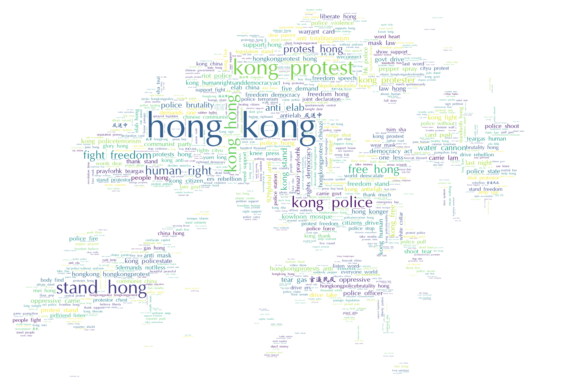

In [661]:
# all_words = []
for phrases in df_wc_tweet.clean_tweets:
    phrases = phrases.split()
    for phrase in phrases: 
        if phrase not in stop_words:
            all_words.append(phrase)

generate_word_cloud(all_words,'sample_tweet_clean_tweet_fig1.jpg')

# Too many Hong Kong related

In [662]:
all_hashtags = []
for hashtag in df.hashtags:
    all_hashtags.extend(ast.literal_eval(hashtag))
    
len([x for x in all_hashtags if "hong" in x.lower() or 'kong' in x.lower()]) / len(all_hashtags)

0.40594736417521715

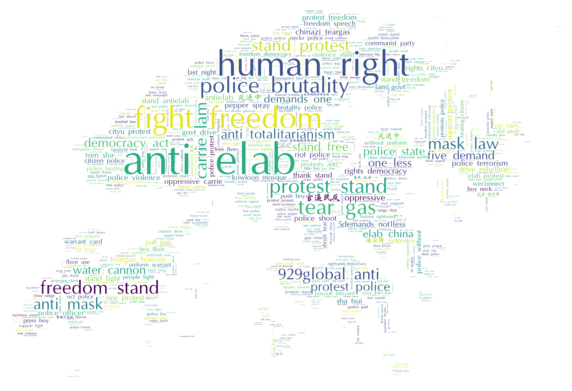

In [663]:
all_words = []
word_list = ['hong','kong','hongkong','hk','ers','amp']
for phrases in df_wc_tweet.clean_tweets:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list):
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_clean_tweet_no_hk_fig2.jpg')

# Use cleaned tweets
# some of the keywords are actually hashtags

In [664]:
set([x for x in all_hashtags if 'ELAB' in x])

{'AnitELAB',
 'AntELAB',
 'AntiELAB',
 'AntiELABHK',
 'AntiELABhk',
 'ELAB',
 'antiELAB',
 'antiELABhk'}

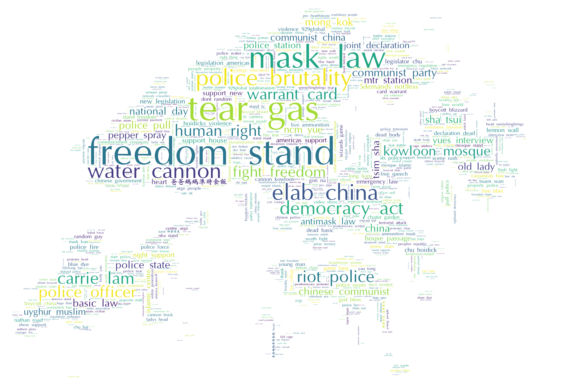

In [665]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp']
for phrases in df_wc_tweet.noun_phrases:
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list):
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_clean_tweet_np_fig3.jpg')

# Use noun phrases -> not bad

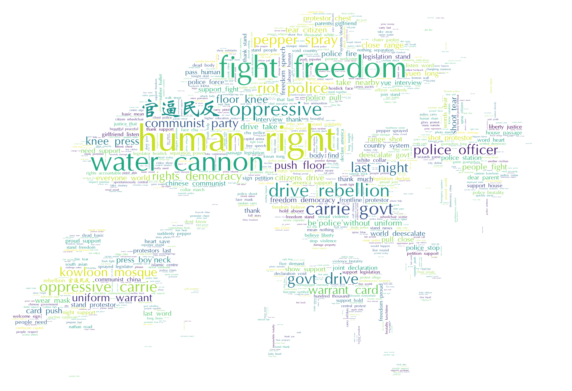

In [666]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
for phrases in df_wc_tweet.without_hashtags:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list) and len(phrase)>3:
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_without_hastag_bigram.jpg',True)

# Use without hashtags bigram --> preferred
# more accurate

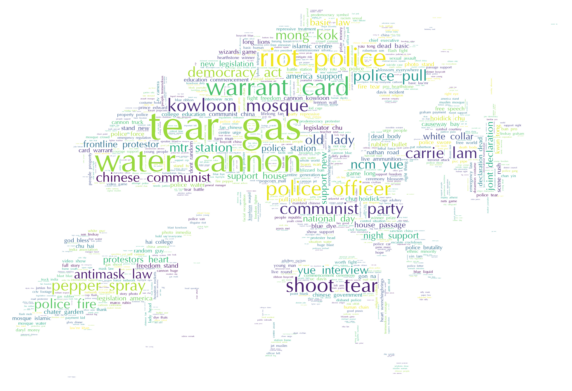

In [667]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
for phrases in df_wc_tweet.without_hashtags_noun_phrases:
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list):
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_without_hastag_noun_phrases.jpg',True)

# Use without hashtags noun phrases --> quite good

In [538]:
set([x for x in all_hashtags if 'brutality' in x])

NameError: name 'all_hashtags' is not defined

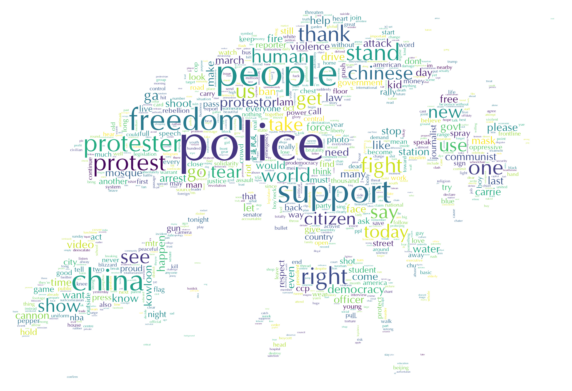

In [668]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
for phrases in df_wc_tweet.without_hashtags:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list):
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_without_hastag_oneGram.jpg',False)

# Use without hashtags single gram


### Word Cloud over time

In [318]:
df_wc_tweet.head()
df_wc_tweet_time = df_wc_tweet.merge(df[['id','weekday','date','time']],on='id',how='inner')

In [158]:
df_wc_tweet_time.head()

,id,text,clean_tweets,noun_phrases,without_hashtags,without_hashtags_noun_phrases,weekday,date,time
0,1176408764590829570,Fringe practicing wanton destruction for destr...,fringe practice wanton destruction for destruc...,"[fringe practice wanton destruction, destructi...",fringe practice wanton destruction for destruc...,"[fringe practice wanton destruction, destructi...",Tue,24/09/2019,08:11:20
1,1176408776959643648,In this battle between democracy versus dictat...,in this battle between democracy versus dictat...,"[democracy versus dictatorship, hong kong i lo...",in this battle between democracy versus dictat...,"[democracy versus dictatorship, hong kong i lo...",Tue,24/09/2019,08:11:23
2,1176408806890147840,If this #VascoWilliams guy isn’t unemployed in...,if this vasco williams guy isnt unemployed in ...,"[vasco williams guy isnt, hr hong kongers, • r...",if this guy isn't unemployed in 48 hr should i...,"[• resignation, man vasco williams, fascist im...",Tue,24/09/2019,08:11:30
3,1176408832714559489,I cosponsored the #HongKongHumanRightsAndDemoc...,i cosponsor the hong kong human rights and dem...,"[i cosponsor, hong kong human rights, democrac...",i cosponsor the to support prodemocracy protes...,"[i cosponsor, support prodemocracy protester, ...",Tue,24/09/2019,08:11:36
4,1176408868395479042,"Also when #HKPolice say ""nothing is more impor...",also when hong kong police say nothing be more...,"[hong kong police, hong kong protestors, yello...",also when say nothing be more important than l...,[],Tue,24/09/2019,08:11:45


#### By Date

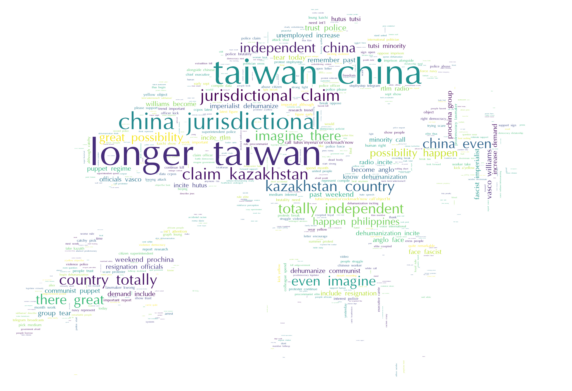

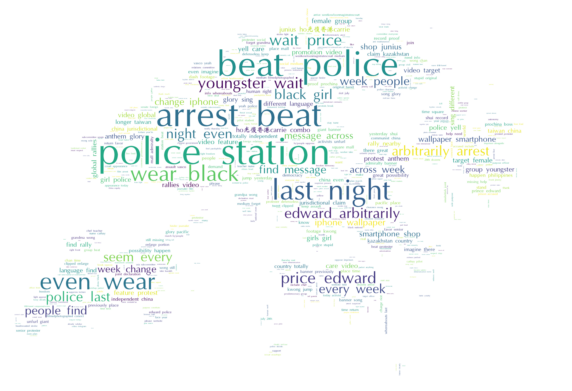

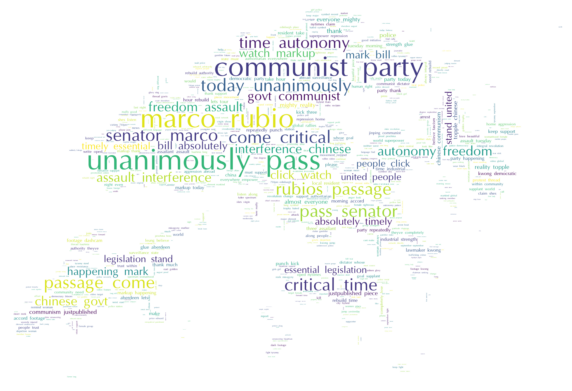

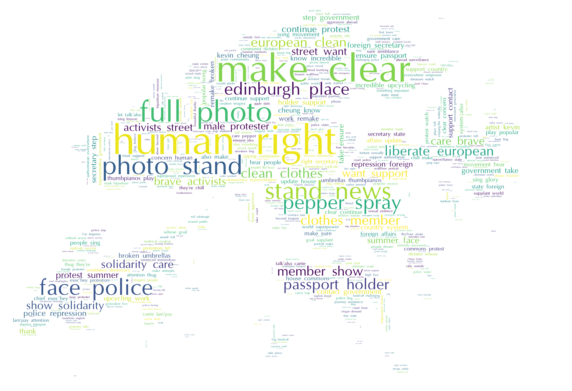

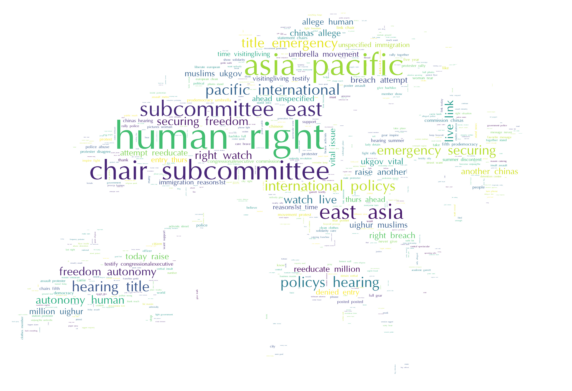

...

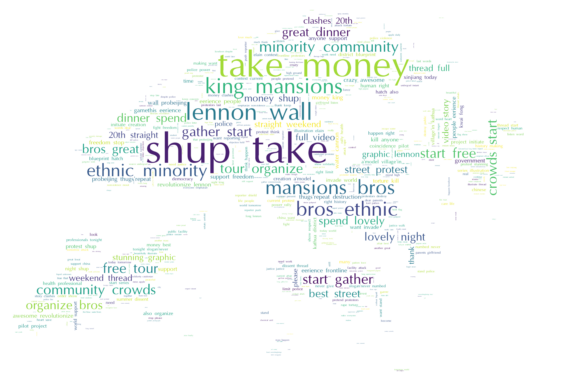

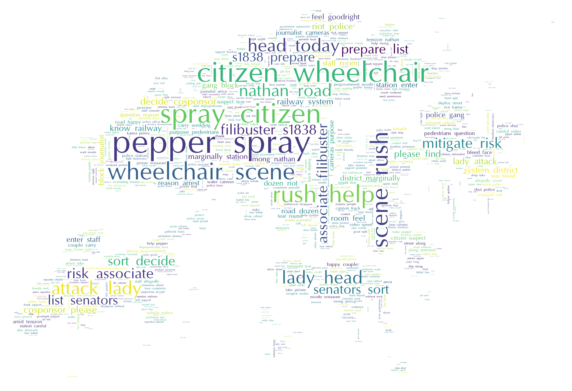

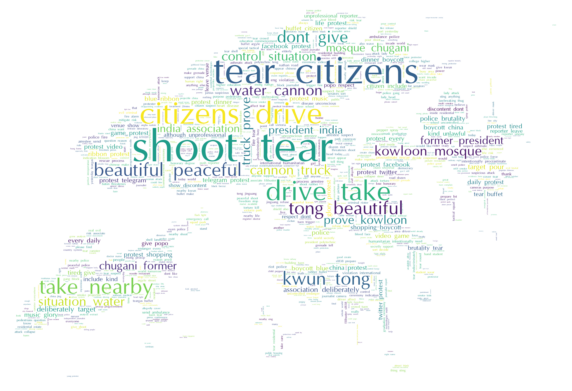

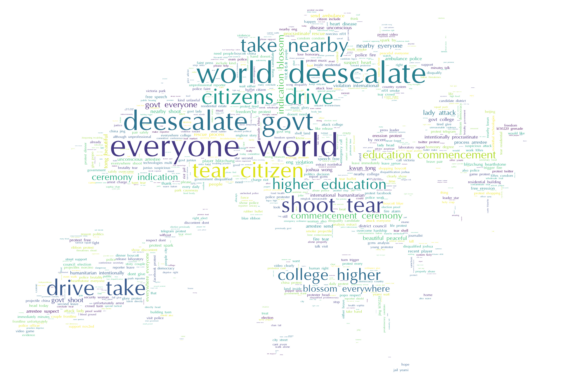

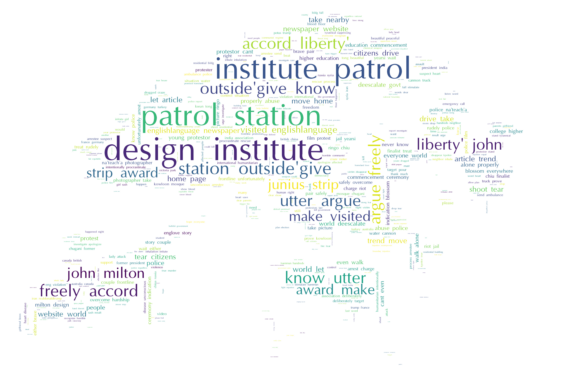

In [159]:
for date in sorted(df_wc_tweet_time.date.unique(),key=lambda x: (x.split('/')[1], x.split('/')[0])):
    df_wc_tweet_spec_date = df_wc_tweet_time.loc[df_wc_tweet_time.date==date]
    
    all_words = []
    word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
    for phrases in df_wc_tweet_spec_date.without_hashtags:
        phrases = phrases.split()
        selected = []
        for phrase in phrases:
            if phrase not in stop_words and not check_phrase_in_list(phrase,word_list) and len(phrase)>3:
                selected.append(phrase) 
        all_words.extend(selected)
        
    date= '-'.join( [date.split('/')[1],date.split('/')[0]])
    file_name = date+"-"+'without_hashtag_bigram.jpg'
    generate_word_cloud(all_words,file_name,True)

## Popular words using doc frequency

as the concept is simlar to word cloud, we will use the same without hashtag column

### Overall

#### Single Gram

In [441]:
doc_freq = {}
to_remove = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
for doc in df_wc_tweet.without_hashtags:
    for word in set(doc.split()):
        if word not in stop_words and len(word) > 3 and word.isalpha() and word not in to_remove:
            try:
                doc_freq[word] +=1
            except:
                doc_freq[word] = 1

In [442]:
doc_freq_list = sorted(doc_freq.items(),key = lambda x: x[1], reverse= True)
doc_freq_list[:20]

[('police', 17567),
 ('people', 9541),
 ('support', 8759),
 ('freedom', 8179),
 ('protester', 7812),
 ('china', 7243),
 ('stand', 7188),
 ('protest', 6552),
 ('fight', 5814),
 ('thank', 4867),
 ('chinese', 4733),
 ('human', 4690),
 ('world', 4686),
 ('take', 4670),
 ('show', 4360),
 ('tear', 4209),
 ('democracy', 4022),
 ('rights', 3830),
 ('today', 3809),
 ('arrest', 3710)]

#### Bigram

In [443]:
reserved_pairs = [
    'carrie lam',
    'tear gas',
    'water cannon',
    'communist party',
    'vasco williams',
    'hong kong',
    'drive rebellion'
]

reserved_dict = {}
for pair in reserved_pairs:
    for ele in pair.split():
        try:
            reserved_dict[ele].add(pair)
        except:
            reserved_dict[ele] = {pair}

In [400]:
df_wc_tweet.without_hashtags_noun_phrases

0        [fringe practice wanton destruction, destructi...
1        [democracy versus dictatorship, hong kong i lo...
3        [• resignation, man vasco williams, fascist im...
4        [i cosponsor, support prodemocracy protester, ...
5                                                       []
6        [incite rtlm radio incite hutus v tutsi minori...
7        [month work, important report research, medium...
8                                       [hong kong police]
9        [• resignation, man vasco williams, fascist im...
10                         [important date, movement mark]
11       [month work, important report research, medium...
12                                  [malaysian government]
13       [jurisdictional claim, china i ca n't, great p...
14                                                      []
15       [police abuse hong kong citizen, police claim,...
18                  [call'cockroach'and now'yellow object]
21                                                      

In [444]:
to_remove = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
all_bi_grams = []

for tweet in df_wc_tweet.without_hashtags:
    for phrase in tb(tweet).ngrams(2):
        str_phrase = ' '.join(phrase)
        add = True
        
        for word in phrase:
            if word in to_remove or len(word) < 3 or not word.isalpha() or word in stop_words or (word in reserved_dict and str_phrase not in reserved_dict[word]):
                add = False
                break
        if add:
            all_bi_grams.append(str_phrase)

In [445]:
bigram_doc_freq = {}
for word in all_bi_grams:
    if word not in to_remove and len(tb(word).noun_phrases)>0:
        try:
            bigram_doc_freq[word] +=1
        except:
            bigram_doc_freq[word] = 1

In [446]:
bigram_doc_freq_list = sorted(bigram_doc_freq.items(),key = lambda x: x[1], reverse= True)
bigram_doc_freq_list[:20]

[('human rights', 4053),
 ('tear gas', 3995),
 ('carrie lam', 2358),
 ('water cannon', 2265),
 ('官逼民反 oppressive', 1444),
 ('riot police', 1375),
 ('pepper spray', 1245),
 ('police officer', 1143),
 ('kowloon mosque', 1111),
 ('warrant card', 1097),
 ('communist party', 1083),
 ('democracy act', 974),
 ('world deescalate', 775),
 ('police pull', 745),
 ('police fire', 666),
 ('antimask law', 635),
 ('mtr station', 632),
 ('ncm yue', 626),
 ('mong kok', 613),
 ('old lady', 597)]

#### 3 grams and more 

In [163]:
def check_similar(a,b):
    if len([x for x in a if x in b])>= len(a)-1:
        return True
    return False

def combine_similar(a,b):
    common = list(set(a) & set(b))
    output =[]
    if(len([x for x in a if x not in b]) >=1 or len([x for x in b if x not in a])>=1  ):
        if list(a).index(common[0]) > list(b).index(common[0]):
            output = list(a)
            output.extend([x for x in list(b) if x not in set(a)])
        else:
            output = list(b)
            output.extend([x for x in list(a) if x not in set(b)])

    return tuple(output)

def clear_similar(n_gram_freq_dict):
    no_similar_dict ={}
    for phrase1 in n_gram_freq_dict.keys():
        similar = False
        for phrase2 in no_similar_dict.keys():
            if check_similar(phrase1,phrase2):
                combined = combine_similar(phrase1,phrase2)
                no_similar_dict[combined] = max(no_similar_dict[phrase2],n_gram_freq_dict[phrase1]) 
                del no_similar_dict[phrase2]
                similar = True
                break
        if not similar:
            no_similar_dict[phrase1] = n_gram_freq_dict[phrase1]
            
    return no_similar_dict

In [164]:
reserved_pairs = [
    "carrie lam gov't",
    'tear gas',
    'water cannon',
    'communist party',
    'vasco williams',
    'hong kong protester',
    'hong kong protestor',
    'hong kong police',
]

reserved_dict = {}
for pair in reserved_pairs:
    for ele in pair.split():
        try:
            reserved_dict[ele].add(pair)
        except:
            reserved_dict[ele] = {pair}

In [165]:
to_remove = ['amp']
all_n_grams = {}

for id, tweet in df_wc_tweet[['id','without_hashtags']].itertuples(index=False):
    tweet = tweet.replace('🇭🇰ers','HKers')
    for phrase in tb(tweet).ngrams(4):
        str_phrase = ' '.join(phrase)
        add = True
        for word in phrase:
            if not word.isalpha() or word in to_remove or (word in reserved_dict and str_phrase not in reserved_dict[word]):
                add = False
                break
        if add:
            try:
                all_n_grams[str_phrase].append(id)
            except:
                all_n_grams[str_phrase] = [id]
    

In [166]:
all_n_grams_count = {tuple(k.split()):len(v) for k,v in all_n_grams.items()}
all_n_grams_count_list = sorted(all_n_grams_count.items(),key=lambda x:x[1],reverse=True)
all_n_grams_count_list[:20]

[(('fight', 'for', 'their', 'freedom'), 1312),
 (('use', 'their', 'knee', 'to'), 997),
 (('their', 'knee', 'to', 'press'), 997),
 (('no', 'warrant', 'card', 'they'), 996),
 (('warrant', 'card', 'they', 'push'), 995),
 (('some', 'of', 'them', 'be'), 933),
 (('of', 'them', 'be', 'just'), 921),
 (('citizens', 'some', 'of', 'them'), 915),
 (('them', 'be', 'just', 'drive'), 915),
 (('be', 'just', 'drive', 'or'), 915),
 (('just', 'drive', 'or', 'take'), 915),
 (('drive', 'or', 'take', 'bus'), 915),
 (('or', 'take', 'bus', 'nearby'), 915),
 (('everyone', 'in', 'the', 'world'), 791),
 (('be', 'fight', 'for', 'their'), 784),
 (('human', 'right', 'and', 'democracy'), 782),
 (('in', 'the', 'world', 'deescalate'), 775),
 (('gun', 'at', 'close', 'range'), 740),
 (('and', 'shot', 'at', 'the'), 740),
 (('pull', 'the', 'gun', 'at'), 736)]

In [177]:
all_n_grams_no_similar_dict = clear_similar(all_n_grams_count)

In [178]:
all_n_grams_no_similar_list = sorted(all_n_grams_no_similar_dict.items(),key=lambda x: x[1],reverse=True)

In [181]:
[x[1] for x in all_n_grams_no_similar_list[:10]]

[915, 915, 915, 775, 563, 552, 459, 458, 458, 458]

#### Word cloud about a topic

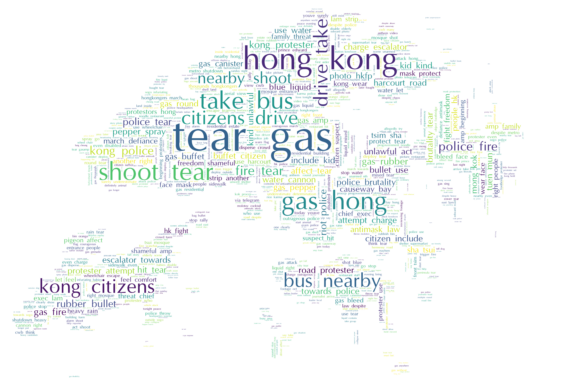

In [471]:
generate_word_cloud(df_wc_tweet[df_wc_tweet.without_hashtags.str.contains('tear gas')].without_hashtags)

In [691]:
to_remove = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
all_bi_grams_topic = []
topic1 = 'human rights'
topic2 = 'democracy act'
for tweet in df_wc_tweet[(df_wc_tweet.without_hashtags.str.contains(topic1)) & (df_wc_tweet.without_hashtags.str.contains(topic2))].without_hashtags:
    for phrase in tb(tweet).ngrams(2):
        str_phrase = ' '.join(phrase)
        add = True
        
        for word in phrase:
            if word == topic or word in to_remove or len(word) < 3 or not word.isalpha() or word in stop_words or (word in reserved_dict and str_phrase not in reserved_dict[word]):
                add = False
                break
        if add and str_phrase != topic and len(tb(str_phrase).noun_phrases) != 0:
            all_bi_grams_topic.append(str_phrase)

In [692]:
sorted({word:all_bi_grams_topic.count(word) for word in set(all_bi_grams_topic)}.items(),key=lambda x:x[1], reverse= True)

[('democracy act', 972),
 ('house pass', 115),
 ('rights violator', 110),
 ('important bill', 110),
 ('bill eresses', 110),
 ('law lets', 99),
 ('basic human', 85),
 ('chater road', 82),
 ('central call', 82),
 ('chater garden', 66),
 ('tiananmen massacre', 64),
 ('precision option', 64),
 ('bbc chinese', 64),
 ('commits tiananmen', 64),
 ('economic destruction', 64),
 ('rightsdemocracy act', 64),
 ('act crowds', 32),
 ('lets vote', 24),
 ('stand news', 23),
 ('bipartisan support', 23),
 ('garden fan', 23),
 ('deter china', 23),
 ('house member', 23),
 ('photos stand', 22),
 ('central liberate', 22),
 ('time photos', 22),
 ('demonstrator stag', 19),
 ('fire truck', 18),
 ('part way', 18),
 ('photo hkfp', 18),
 ('popular reputation', 18),
 ('monday night', 18),
 ('protester photo', 18),
 ('crowds part', 18),
 ('josh hawley', 16),
 ('mcconnell need', 15),
 ('senator josh', 15),
 ('america need', 15),
 ('strong message', 15),
 ('mong kok', 15),
 ('act leader', 15),
 ('confrontation hotspo

#### Topic association

In [669]:
links = []
to_remove = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
top_bigrams = [x[0] for x in bigram_doc_freq_list[:20]]
for i in range(0,len(top_bigrams)-1):
    first = top_bigrams[i]
    for j in range(i+1,len(top_bigrams)):
        second = top_bigrams[j]

        links.append([
            first, second,
            len(df_wc_tweet[(df_wc_tweet.without_hashtags.str.contains(first)) & (df_wc_tweet.without_hashtags.str.contains(second))].without_hashtags)
        ])

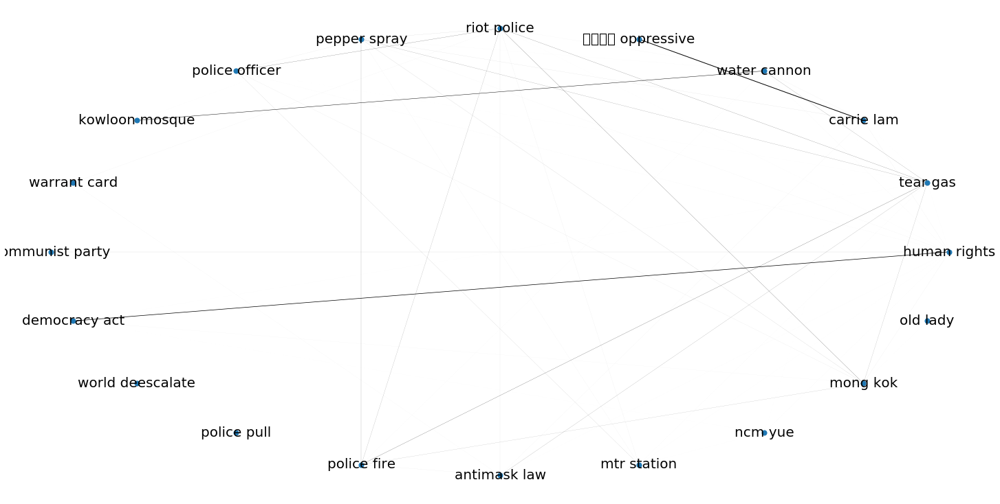

In [693]:
import networkx as nx
G= nx.Graph()
G.add_nodes_from(top_bigrams)

for link in links:
    G.add_edge(link[0],link[1],weight=link[2])

edges = G.edges()

weights_raw = [G[u][v]['weight'] for u,v in edges]
weights = [(x-min(weights_raw))/(max(weights_raw) - min(weights_raw)) for x in weights_raw]

pos= nx.circular_layout(G)
plt.figure(figsize=(20,10))
nx.draw(G, pos=pos, edges=edges, width=weights,node_size=50)
nx.draw_networkx_labels(G,pos=pos,font_size=20)
plt.savefig('prez-img/topic association.png',dpi=300)


In [684]:
from community import best_partition

partitions = best_partition(G)
communities = {}
for k,v in partitions.items():
    try:
        communities[v].append(k)
    except:
        communities[v] = [k]

### Over Time

####  Single Gram

In [413]:
time_pop_words = {}
for date in sorted(df_wc_tweet_time.date.unique(),key=lambda x: (x.split('/')[1], x.split('/')[0])):
    df_wc_tweet_spec_date = df_wc_tweet_time.loc[df_wc_tweet_time.date==date]
        
    to_remove = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
    doc_freq = {}
    
    for doc in df_wc_tweet_spec_date.without_hashtags:
        for word in set(doc.split()):
            if word not in stop_words and len(word) > 3 and word.isalpha() and word not in to_remove:
                try:
                    doc_freq[word] +=1
                except:
                    doc_freq[word] = 1
                    
    doc_freq_list = sorted(doc_freq.items(),key = lambda x: x[1], reverse= True)
    x=0
    for word,freq in doc_freq_list:
        try:
            time_pop_words[date].append(word)
        except:
            time_pop_words[date] = [word]
        x+=1
        if x ==10:
            break

In [464]:
pd.DataFrame.from_dict(time_pop_words,orient='columns')

,24/09/2019,25/09/2019,26/09/2019,27/09/2019,28/09/2019,29/09/2019,30/09/2019,01/10/2019,02/10/2019,03/10/2019,...,21/10/2019,22/10/2019,23/10/2019,24/10/2019,25/10/2019,26/10/2019,27/10/2019,28/10/2019,29/10/2019,30/10/2019
0,police,police,chinese,police,right,police,police,police,police,police,...,police,police,people,support,stand,take,citizen,tear,world,police
1,people,people,people,support,human,pepper,protest,chest,protester,support,...,water,people,stand,thank,thank,money,police,police,govt,world
2,claim,arrest,time,protester,hearing,stop,people,protester,protest,student,...,mosque,fight,support,stand,people,shup,spray,shoot,everyone,know
3,even,find,stand,protest,freedom,face,protester,shot,china,shot,...,cannon,instead,thank,today,police,protest,help,take,deescalate,take
4,china,even,freedom,photo,autonomy,suddenly,today,close,fight,protester,...,protester,thank,police,people,sing,police,pepper,nearby,tear,tear
5,happen,video,assault,people,international,legislator,show,shoot,charge,shoot,...,blue,protester,show,human,today,start,attack,drive,shoot,shoot
6,imagine,protest,party,take,live,violence,fire,protestor,must,country,...,kowloon,tear,freedom,right,freedom,great,wheelchair,citizens,take,institute
7,great,beat,communist,make,watch,march,video,pull,shot,hongkongers,...,reporter,journalist,fight,solidarity,support,organize,scene,peaceful,drive,make
8,independent,group,pass,ling,pacific,officer,national,range,year,power,...,spray,world,night,show,right,support,rush,beautiful,nearby,design
9,longer,last,autonomy,government,emergency,tear,support,bullet,tear,nothing,...,freedom,attack,hand,china,would,kongers,firstaiders,kwun,citizens,station


#### Bigram

In [452]:
reserved_pairs = [
    'carrie lam',
    'tear gas',
    'water cannon',
    'communist party',
    'vasco williams',
    'hong kong',
    'drive rebellion'
]

reserved_dict = {}
for pair in reserved_pairs:
    for ele in pair.split():
        try:
            reserved_dict[ele].add(pair)
        except:
            reserved_dict[ele] = {pair}

In [463]:
time_pop_words_bigram = {}
time_pop_words_bigram_freq = {}
for date in sorted(df_wc_tweet_time.date.unique(),key=lambda x: (x.split('/')[1], x.split('/')[0])):
    df_wc_tweet_spec_date = df_wc_tweet_time.loc[df_wc_tweet_time.date==date]
    doc_freq = {}
    for tweet in df_wc_tweet_spec_date.without_hashtags:
        for phrase in tb(tweet).ngrams(2):
            str_phrase = ' '.join(phrase)
            add = True

            for word in phrase:
                if word in to_remove or len(word) < 3 or not word.isalpha() or word in stop_words or (word in reserved_dict and str_phrase not in reserved_dict[word]):
                    add = False
                    break
            if add:
                try:
                    doc_freq[str_phrase] +=1
                except:
                    doc_freq[str_phrase] = 1
                    
    doc_freq_list = sorted(doc_freq.items(),key = lambda x: x[1], reverse= True)
    x=0
    for word,freq in doc_freq_list:
        if word =='human right':
            word = 'human rights'
        if len(tb(word).noun_phrases)>0:
            try:
                time_pop_words_bigram[date].append(word)
                time_pop_words_bigram_freq[date][word]=freq
            except:
                time_pop_words_bigram[date] = [word]
                time_pop_words_bigram_freq[date]={word:freq}
            x+=1
            if x ==10:
                break

In [465]:
all_topics_freq = {}
for date,words in time_pop_words_bigram.items():
    for word in words:
        if len(tb(word).noun_phrases)>0:
            try:
                all_topics_freq[word] += 1
            except:
                all_topics_freq[word] = 1


In [466]:
sorted(all_topics_freq.items(), key=lambda x:x[1], reverse= True)

[('human rights', 14),
 ('tear gas', 12),
 ('carrie lam', 6),
 ('pepper spray', 6),
 ('riot police', 5),
 ('democracy act', 5),
 ('police officer', 4),
 ('water cannon', 4),
 ('antimask law', 3),
 ('kowloon mosque', 3),
 ('roy kwong', 2),
 ('police station', 2),
 ('communist party', 2),
 ('causeway bay', 2),
 ('full story', 2),
 ('story photo', 2),
 ('photo hkfp', 2),
 ('police fire', 2),
 ('tsuen wan', 2),
 ('support hongkongers', 2),
 ('basic law', 2),
 ('joint declaration', 2),
 ('官逼民反 oppressive', 2),
 ('dead body', 2),
 ('white collar', 2),
 ('allege sexual', 2),
 ('sexual violence', 2),
 ('warrant card', 2),
 ('chater garden', 2),
 ('god bless', 2),
 ('mong kok', 2),
 ('jimmy sham', 2),
 ('islamic centre', 2),
 ('ncm yue', 2),
 ('frontline protestors', 2),
 ('dear parents', 2),
 ('heart wrenchingbrings', 2),
 ('battle station', 2),
 ('backpack 官逼民反', 2),
 ('blue dye', 2),
 ('sts police', 2),
 ('police swore', 2),
 ('entire generation', 2),
 ('freedom stand', 2),
 ('flash fight', 

In [469]:
time_pop_words_bigram_df.to_csv('time_pop_words_bigram.csv',index=False)

In [489]:
time_pop_words_bigram_freq.values()

dict_values([{'jurisdictional claim': 51, 'great possibility': 51, 'vasco williams': 26, 'past weekend': 23, 'prochina group': 23, 'fascist imperialist': 22, 'imperialist dehumanize': 22, 'puppet regime': 22, 'roy kwong': 22, 'tin shui': 21}, {'police station': 29, 'price edward': 28, 'week people': 27, 'new way': 27, 'smartphone shop': 27, 'shop dat': 27, 'dat junius': 27, 'junius ho光復香港carrie': 27, 'police yell': 27, 'target female': 27}, {'communist party': 135, 'senator marco': 131, 'marco rubios': 131, 'critical time': 131, 'chinese govt': 131, 'essential legislation': 108, 'topple chinese': 30, 'chinese communism': 30, 'roy kwong': 23, 'local resident': 17}, {'human rights': 52, 'carrie lam': 40, 'full photo': 38, 'photo stand': 36, 'stand news': 36, 'pepper spray': 31, 'edinburgh place': 31, 'passport holder': 28, 'clean clothes': 28, 'clothes campaign': 28}, {'human rights': 144, 'chair subcommittee': 88, 'international cybersecurity': 88, 'cybersecurity policys': 88, 'policys 

In [506]:
all_topic_words = set()
time_pop_words_bigram_freq_selected = {}

for k,v in time_pop_words_bigram_freq.items():
    time_pop_words_bigram_freq_selected[k] = {}
    for word, freq in v.items():
        if word in [x[0] for x in bigram_doc_freq_list[:10]]:
            time_pop_words_bigram_freq_selected[k][word] = freq
            all_topic_words.add(word)
time_pop_words_bigram_freq_selected

{'24/09/2019': {},
 '25/09/2019': {},
 '26/09/2019': {},
 '27/09/2019': {'human rights': 52, 'carrie lam': 40, 'pepper spray': 31},
 '28/09/2019': {'human rights': 144},
 '29/09/2019': {'tear gas': 521, 'pepper spray': 181},
 '30/09/2019': {'riot police': 131, 'pepper spray': 116, 'tear gas': 88},
 '01/10/2019': {'riot police': 314, 'police officer': 154},
 '02/10/2019': {'tear gas': 140},
 '03/10/2019': {},
 '04/10/2019': {'carrie lam': 1136, '官逼民反 oppressive': 1071},
 '05/10/2019': {'carrie lam': 462, '官逼民反 oppressive': 363, 'tear gas': 106},
 '06/10/2019': {'tear gas': 337, 'riot police': 165},
 '07/10/2019': {'human rights': 316},
 '08/10/2019': {'human rights': 166},
 '09/10/2019': {},
 '10/10/2019': {},
 '11/10/2019': {'human rights': 79},
 '12/10/2019': {},
 '13/10/2019': {'warrant card': 903, 'police officer': 193},
 '14/10/2019': {'human rights': 215,
  'warrant card': 132,
  'pepper spray': 109,
  'riot police': 92,
  'police officer': 91},
 '15/10/2019': {'human rights': 287

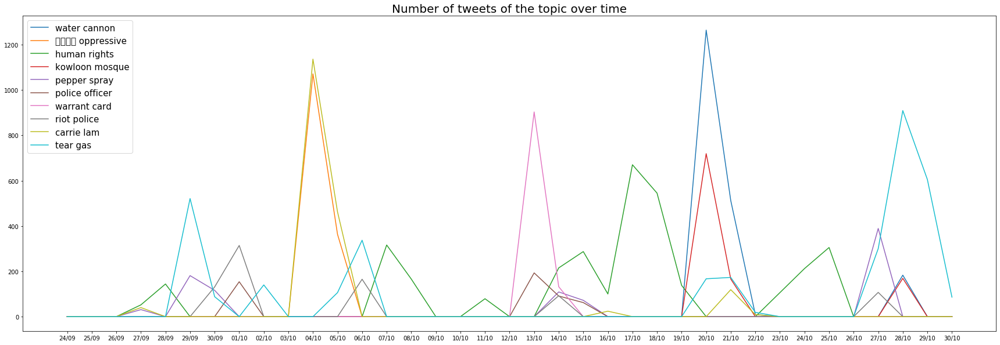

In [695]:
dates = time_pop_words_bigram_freq_selected.keys()
legend = []
fig = plt.figure(figsize=(30,10))
for word in all_topic_words:
    word_date_freq = []
    for date in dates:
        if word in time_pop_words_bigram_freq_selected[date].keys():
            word_date_freq.append(time_pop_words_bigram_freq_selected[date][word])
        else:
            word_date_freq.append(0)
    plt.plot(sorted( [x[:5] for x in dates], key=lambda x:(x.split('/')[1],x.split('/')[0])),word_date_freq)
    legend.append(word)
plt.title("Number of tweets of the topic over time",fontsize=20)
plt.legend(legend,fontsize=15)
plt.savefig('prez-img/fig_poptopics.png',dpi=100)
plt.show()


## Sentiment Analysis

### Overall

In [7]:
df_sa_tweet = df_en_tweet.copy()

In [8]:
df_sa_tweet['sentiment_tweets'] = df_sa_tweet.text.str.replace("’|‘|”|“","'")
df_sa_tweet['sentiment_tweets'] = df_sa_tweet.sentiment_tweets.str.replace(" ' ","'")
df_sa_tweet['sentiment_tweets'] = df_sa_tweet.sentiment_tweets.apply(clean_tweet_sentiment)

In [9]:
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to C:\Users\Qi
[nltk_data]     Haodi\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [10]:
df_sa_tweet['polarity_score'] = df_sa_tweet.sentiment_tweets.apply(sid.polarity_scores)

In [11]:
df_sa_tweet['compound'] = df_sa_tweet['polarity_score'].apply(lambda x: x['compound'])

In [12]:
df_sa_tweet['sentiment_result'] = pd.cut(df_sa_tweet['compound'],bins=(-1,-0.05,0.05,1),labels=['neg','neu','pos'])

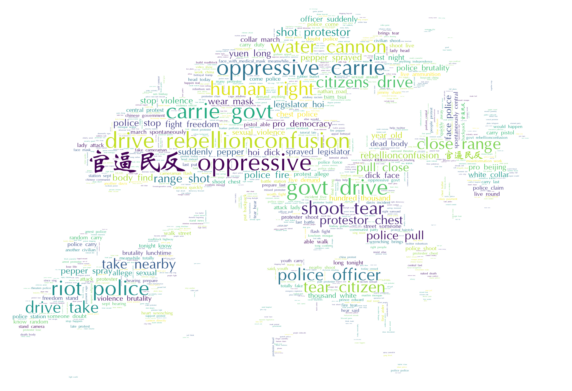

In [48]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','anti','totalitarianism','929global']
for phrases in df_sa_tweet[df_sa_tweet.sentiment_result=='neg'].sentiment_tweets:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list) and len(phrase)>3:
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_neg_sentiment.jpg')

In [ ]:
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','anti','totalitarianism','929global','stand']
for phrases in df_sa_tweet[df_sa_tweet.sentiment_result=='pos'].sentiment_tweets:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list) and len(phrase)>3:
            selected.append(phrase) 
    all_words.extend(selected)

generate_word_cloud(all_words,'sample_tweet_pos_sentiment.jpg')

In [138]:
overall_sentiment = df_sa_tweet.groupby('sentiment_result').count()[['id']] / len(df_sa_tweet) * 100
overall_sentiment.columns = ['proportion of tweets in %']
overall_sentiment['mean score'] =df_sa_tweet['compound'].mean()
overall_sentiment['median score'] = df_sa_tweet['compound'].median()
overall_sentiment

# by proportion - neg
# by mean - neu
# by median - neu

,proportion of tweets in %,mean score,median score
sentiment_result,,,
neg,42.465728,0.000006,0.0
neu,15.425762,0.000006,0.0
pos,42.108510,0.000006,0.0


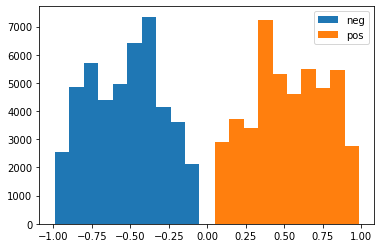

In [526]:
y1 = list(df_sa_tweet[df_sa_tweet.sentiment_result=='neg']['compound'])
y2 = list(df_sa_tweet[df_sa_tweet.sentiment_result=='pos']['compound'])

fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(y1)
plt.hist(y2)
ax.legend(['neg','pos'])
plt.savefig('fig2.2.9.png')
plt.show()

### Over time

In [13]:
import pycountry_convert as pcc

df_sa_tweet_time = df_sa_tweet.merge(df[['id','weekday','date','time']],on='id',how='inner')
df_sa_tweet_time_region = df_sa_tweet_time.merge(df[['id','country_code']],how='inner')
df_sa_tweet_time_region['country_code'] = df_sa_tweet_time_region['country_code'].fillna('')
df_sa_tweet_time_region['country'] = df_sa_tweet_time_region['country_code'].apply(lambda x: x if x=='' else pcc.country_alpha2_to_country_name(x))
df_sa_tweet_time_region[['id','compound','sentiment_result','date','country']].to_csv('sample_sentiment_by_date_region.csv',index=False)

#### By mean score

In [79]:
by_date_sentiment_mean_score = df_sa_tweet_time.groupby('date').mean()[['compound']]
by_date_sentiment_mean_score.loc[by_date_sentiment_mean_score['compound'] >0.05,'sentiment_result'] = 'pos'
by_date_sentiment_mean_score.loc[by_date_sentiment_mean_score['compound'] <-0.05,'sentiment_result'] = 'neg'

by_date_sentiment_mean_score.loc[(by_date_sentiment_mean_score['compound'] <=0.05)&(by_date_sentiment_mean_score['compound'] >=-0.05),'sentiment_result'] = 'neu'
by_date_sentiment_mean_score.head(2)

,compound,sentiment_result
date,,
01/10/2019,-0.266026,neg
02/10/2019,-0.017813,neu


In [112]:
by_date_sentiment_mean_score_summary = by_date_sentiment_mean_score.groupby('sentiment_result').count()
by_date_sentiment_mean_score_summary.columns = ['count-by-mean']
by_date_sentiment_mean_score_summary

,count-by-mean
sentiment_result,
neg,16
neu,8
pos,13


#### By median

In [90]:
by_date_sentiment_median_score = df_sa_tweet_time.groupby('date').median()[['compound']]
by_date_sentiment_median_score.loc[by_date_sentiment_median_score['compound'] >0.05,'sentiment_result'] = 'pos'
by_date_sentiment_median_score.loc[by_date_sentiment_median_score['compound'] <-0.05,'sentiment_result'] = 'neg'

by_date_sentiment_median_score.loc[(by_date_sentiment_median_score['compound'] <=0.05)&(by_date_sentiment_median_score['compound'] >=-0.05),'sentiment_result'] = 'neu'
by_date_sentiment_median_score.head(2)

,compound,sentiment_result
date,,
01/10/2019,-0.34,neg
02/10/2019,0.00,neu


In [114]:
by_date_sentiment_median_score_summary = by_date_sentiment_median_score.groupby('sentiment_result').count()
by_date_sentiment_median_score_summary.columns = ['count-by-median']
by_date_sentiment_median_score_summary

,count-by-median
sentiment_result,
neg,6
neu,21
pos,10


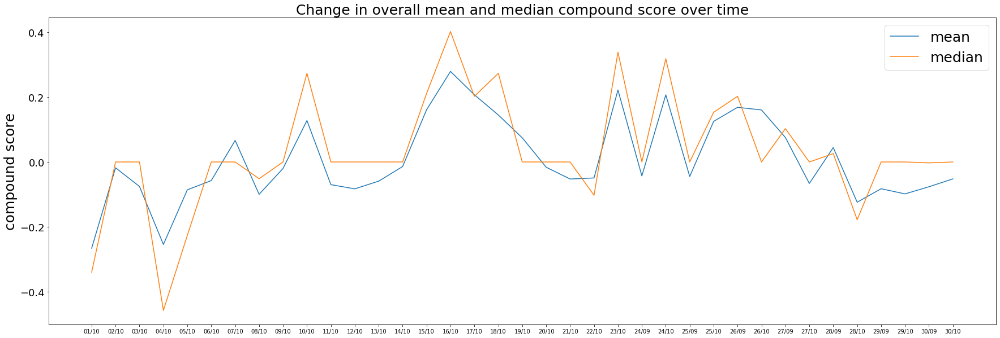

In [696]:
by_date_scores_dict = by_date_scores.reset_index().to_dict(orient='list')
by_date_scores_dict['date'] = [x[:5] for x in by_date_scores_dict['date']]

fig = plt.figure(figsize=(30,10))

ax1 = fig.add_subplot(111)
ax1.set_ylabel('compound score',fontsize = 25)
ax1.set_title('Change in overall mean and median compound score over time',fontsize = 25)
plt.yticks(size=18)

plt.plot(by_date_scores_dict['date'],by_date_scores_dict['mean score'])
plt.plot(by_date_scores_dict['date'],by_date_scores_dict['median score'])

ax1.legend(['mean','median'],fontsize = 25)

plt.savefig('prez-img/fig2.2.10.png',dpi=100)
plt.show()


#### By Proportion

In [46]:
by_date_count = df_sa_tweet_time.groupby(['date']).count()
by_date_sentiment_proportion = df_sa_tweet_time.groupby(['date','sentiment_result']).count().div(by_date_count,level=0)[['compound']]
by_date_sentiment_proportion = by_date_sentiment_proportion.reset_index()
by_date_sentiment_proportion.head()

,date,sentiment_result,compound
0,01/10/2019,neg,0.686040
1,01/10/2019,neu,0.126562
2,01/10/2019,pos,0.187398
3,02/10/2019,neg,0.452093
4,02/10/2019,neu,0.162445


In [47]:
by_date_sentiment_proportion['compound'] = by_date_sentiment_proportion['compound']*100
by_date_sentiment_proportion.columns = list(by_date_sentiment_proportion.columns[:2])+['proportion']
by_date_sentiment_proportion.head()

,date,sentiment_result,proportion
0,01/10/2019,neg,68.604020
1,01/10/2019,neu,12.656165
2,01/10/2019,pos,18.739815
3,02/10/2019,neg,45.209251
4,02/10/2019,neu,16.244493


In [118]:
date_sentiment_result_by_proportion = {}
for score in by_date_sentiment_proportion.groupby('date')['proportion'].max():
    date_sentiment_result_by_proportion[
        by_date_sentiment_proportion.set_index('proportion').to_dict(orient='index')[score]['date']
    ] = by_date_sentiment_proportion.set_index('proportion').to_dict(orient='index')[score]['sentiment_result']

by_date_sentiment_result_by_proportion_summary = pd.DataFrame.from_dict(date_sentiment_result_by_proportion,orient='index').reset_index().groupby(0).count()
by_date_sentiment_result_by_proportion_summary.columns = ['count-by-proportion']
by_date_sentiment_result_by_proportion_summary

,count-by-proportion
0,
neg,20
pos,17


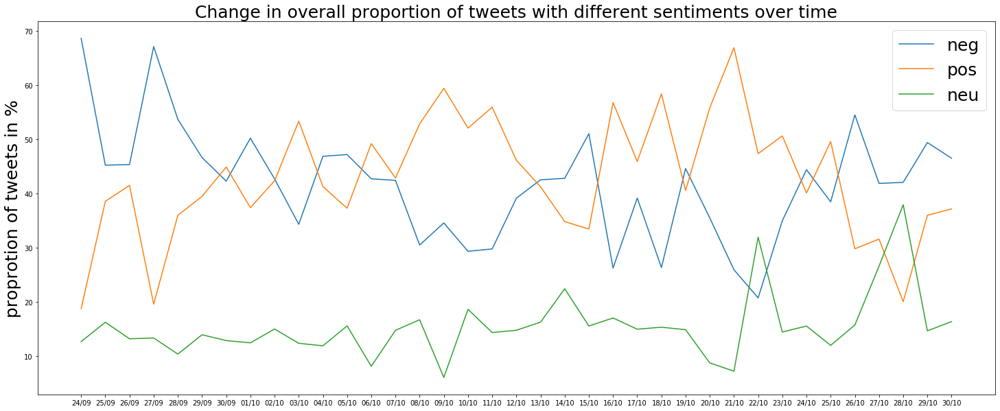

In [697]:
dates = sorted([x[:5] for x in by_date_sentiment_proportion.date.unique()],key= lambda x: (x.split('/')[1],x.split('/')[0]))
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(111)
ax1.set_ylabel('proprotion of tweets in %',fontsize = 25)
ax1.set_title('Change in overall proportion of tweets with different sentiments over time',fontsize = 25)

plt.plot(dates, by_date_sentiment_proportion[by_date_sentiment_proportion.sentiment_result=='neg'].proportion)
plt.plot(dates, by_date_sentiment_proportion[by_date_sentiment_proportion.sentiment_result=='pos'].proportion)
plt.plot(dates, by_date_sentiment_proportion[by_date_sentiment_proportion.sentiment_result=='neu'].proportion)

ax1.legend(['neg','pos','neu'],fontsize = 25)

plt.savefig('prez-img/fig2.2.11.png',dpi=100)
plt.show()


In [58]:
by_date_sentiment_proportion.to_csv('sample_sentiment_proportion_by_date.csv',index=False)

#### Analyse dates

In [216]:
by_date_sentiment_proportion

,date,sentiment_result,proportion
0,01/10/2019,neg,68.604020
1,01/10/2019,neu,12.656165
2,01/10/2019,pos,18.739815
3,02/10/2019,neg,45.209251
4,02/10/2019,neu,16.244493
5,02/10/2019,pos,38.546256
6,03/10/2019,neg,45.329513
7,03/10/2019,neu,13.180516
8,03/10/2019,pos,41.489971
9,04/10/2019,neg,67.089249


In [ ]:
by_date_scores_dict = by_date_scores.reset_index().to_dict(orient='list')
by_date_scores_dict['date'] = [x[:5] for x in by_date_scores_dict['date']]

fig = plt.figure(figsize=(30,10))

ax1 = fig.add_subplot(111)
ax1.set_ylabel('compound score')
ax1.set_title('Change in overall mean and median compound score over time')

plt.plot(by_date_scores_dict['date'],by_date_scores_dict['mean score'])
plt.plot(by_date_scores_dict['date'],by_date_scores_dict['median score'])
ax1.legend(['mean','median'])
plt.show()

plt.savefig('fig9.png')

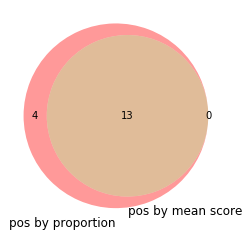

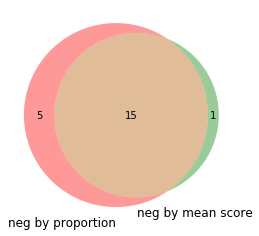

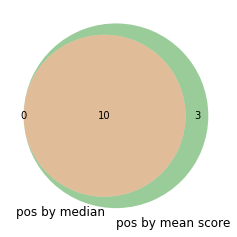

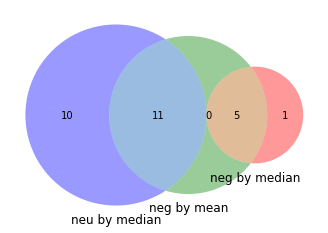

In [682]:
from matplotlib_venn import venn2, venn3

pos_days_proportion = [date for date,result in date_sentiment_result_by_proportion.items() if result == 'pos']
neg_days_proportion = [date for date,result in date_sentiment_result_by_proportion.items() if result == 'neg']

pos_days_mean_score = by_date_sentiment_mean_score.loc[by_date_sentiment_mean_score.sentiment_result=='pos'].index
neg_days_mean_score = by_date_sentiment_mean_score.loc[by_date_sentiment_mean_score.sentiment_result=='neg'].index

pos_days_median_score = by_date_sentiment_median_score.loc[by_date_sentiment_median_score.sentiment_result=='pos'].index
neg_days_median_score = by_date_sentiment_median_score.loc[by_date_sentiment_median_score.sentiment_result=='neg'].index
neu_days_median_score = by_date_sentiment_median_score.loc[by_date_sentiment_median_score.sentiment_result=='neu'].index

# ax, figure = plt.subplots(nrows=2,ncols=1)
# First way to call the 2 group Venn diagram:
venn2(subsets = (set(pos_days_proportion), set(pos_days_mean_score)), set_labels = ('pos by proportion', 'pos by mean score'))
plt.show()

# First way to call the 2 group Venn diagram:
venn2(subsets = (set(neg_days_proportion), set(neg_days_mean_score)), set_labels = ('neg by proportion', 'neg by mean score'))
plt.show()

venn2(subsets = (set(pos_days_median_score), set(pos_days_mean_score)), set_labels = ('pos by median', 'pos by mean score'))
plt.show()

venn3(subsets = (set(neg_days_median_score), set(neg_days_mean_score),set(neu_days_median_score)), set_labels = ('neg by median', 'neg by mean','neu by median'))

plt.savefig('prez-img/fig2.2.12.png',dpi=500)

plt.show()


In [121]:
by_date_sentiment_median_score_summary.join(by_date_sentiment_mean_score_summary).join(by_date_sentiment_result_by_proportion_summary)

,count-by-median,count-by-mean,count-by-proportion
sentiment_result,,,
neg,6,16,20.0
neu,21,8,NaN
pos,10,13,17.0


In [102]:
# Mean vs Median
mean_median_controversial_days = set([x for x in pos_days_median_score if x not in pos_days_mean_score] 
                         + [x for x in pos_days_mean_score if x not in pos_days_median_score] 
                         + [x for x in neg_days_median_score if x not in neg_days_mean_score] 
                         + [x for x in neg_days_mean_score if x not in neg_days_median_score]) 

mean_median_controversial_days_sentiment = {}

for day in mean_median_controversial_days:
    # [by proportion, by mean score]
    mean_median_controversial_days_sentiment[day] = {}
   
    mean_median_controversial_days_sentiment[day]['by-mean'] = by_date_sentiment_mean_score.loc[day,'sentiment_result']
    mean_median_controversial_days_sentiment[day]['by-median'] = by_date_sentiment_median_score.loc[day,'sentiment_result']


mean_median_controversial_days_result = pd.DataFrame.from_dict(mean_median_controversial_days_sentiment,orient='index')
mean_median_controversial_days_result.reset_index().groupby(['by-median','by-mean']).count()

index
by-median by-mean       
neg       neu          1
neu       neg         11
          pos          3

In [107]:
# mean vs proportion
mean_proportion_controversial_days = set([x for x in pos_days_proportion if x not in pos_days_mean_score] 
                         + [x for x in pos_days_mean_score if x not in pos_days_proportion] 
                         + [x for x in neg_days_proportion if x not in neg_days_mean_score] 
                         + [x for x in neg_days_mean_score if x not in neg_days_proportion]) 

mean_proportion_controversial_days_sentiment = {}

for day in mean_proportion_controversial_days:
    # [by proportion, by mean score]
    mean_proportion_controversial_days_sentiment[day] = {}
    mean_proportion_controversial_days_sentiment[day]['by-proportion'] = date_sentiment_result_by_proportion[day]
    
    mean_proportion_controversial_days_sentiment[day]['by-mean'] = by_date_sentiment_mean_score.loc[day,'sentiment_result']

mean_proportion_controversial_days_result = pd.DataFrame.from_dict(mean_proportion_controversial_days_sentiment,orient='index')
mean_proportion_controversial_days_result.reset_index().groupby(['by-proportion','by-mean']).count()

index
by-proportion by-mean       
neg           neu          5
pos           neg          1
              neu          3

In [109]:
# mean vs proportion
median_proportion_controversial_days = set([x for x in pos_days_proportion if x not in pos_days_median_score] 
                         + [x for x in pos_days_median_score if x not in pos_days_proportion] 
                         + [x for x in neg_days_proportion if x not in neg_days_median_score] 
                         + [x for x in neg_days_median_score if x not in neg_days_proportion]) 

median_proportion_controversial_days_sentiment = {}

for day in median_proportion_controversial_days:

    median_proportion_controversial_days_sentiment[day] = {}
    median_proportion_controversial_days_sentiment[day]['by-proportion'] = date_sentiment_result_by_proportion[day]
    
    median_proportion_controversial_days_sentiment[day]['by-median'] = by_date_sentiment_median_score.loc[day,'sentiment_result']

median_proportion_controversial_days_result = pd.DataFrame.from_dict(median_proportion_controversial_days_sentiment,orient='index')
median_proportion_controversial_days_result.reset_index().groupby(['by-proportion','by-median']).count()

,,index
by-proportion,by-median,
neg,neu,14
pos,neu,7


In [270]:
set(neg_days_proportion)

{'01/10/2019',
 '02/10/2019',
 '03/10/2019',
 '04/10/2019',
 '05/10/2019',
 '06/10/2019',
 '08/10/2019',
 '09/10/2019',
 '11/10/2019',
 '12/10/2019',
 '20/10/2019',
 '21/10/2019',
 '22/10/2019',
 '25/09/2019',
 '27/10/2019',
 '28/10/2019',
 '29/09/2019',
 '29/10/2019',
 '30/09/2019',
 '30/10/2019'}

In [277]:
set(neg_days_mean_score) & set(neg_days_proportion) & set(by_date_sentiment_median_score[by_date_sentiment_median_score.sentiment_result=='neu'].index)

{'03/10/2019',
 '06/10/2019',
 '11/10/2019',
 '12/10/2019',
 '21/10/2019',
 '27/10/2019',
 '29/09/2019',
 '29/10/2019',
 '30/09/2019',
 '30/10/2019'}

In [300]:
set(neg_days_mean_score) & set(neg_days_proportion) & set(by_date_sentiment_median_score[by_date_sentiment_median_score.sentiment_result=='neg'].index)

{'01/10/2019', '04/10/2019', '05/10/2019', '08/10/2019', '28/10/2019'}

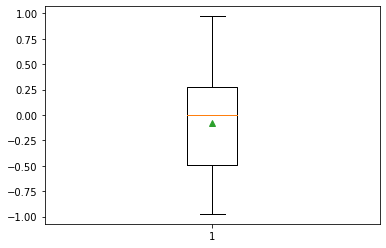

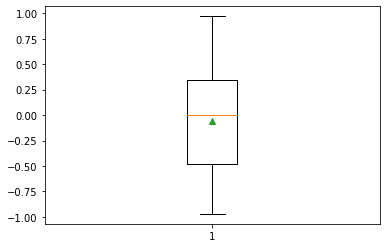

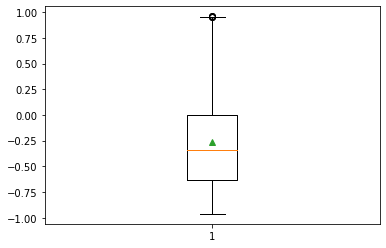

In [301]:
ax,fig=plt.subplots()
plt.boxplot(df_sa_tweet_time[df_sa_tweet_time.date=='03/10/2019']['compound'],showmeans=True)
plt.show()
plt.boxplot(df_sa_tweet_time[df_sa_tweet_time.date=='06/10/2019']['compound'],showmeans=True)
plt.show()
plt.boxplot(df_sa_tweet_time[df_sa_tweet_time.date=='01/10/2019']['compound'],showmeans=True)
plt.show()

### by Topic

In [322]:
pop_topic_all_bigram = set()

for phrases in time_pop_words_bigram.values():
    for phrase in phrases:
        pop_topic_all_bigram.add(phrase)
        
topic_sentiment= {}
for tweet,score in df_sa_tweet[['sentiment_tweets','compound']].itertuples(index=False):
    for topic in pop_topic_all_bigram:
        if topic in tweet:
            try:
                topic_sentiment[topic].append(score)
            except:
                topic_sentiment[topic]=[score]

#### By overall mean sentiment score

In [323]:
topic_sentiment_mean = {}
topic_sentiment_mean_distribution = {} # topic: [pos_count, neu_count, neg_count]
for topic, scores in topic_sentiment.items():
    topic_sentiment_mean[topic] = np.mean(scores)
    pos = [x for x in scores if x > 0.05]
    neu = [x for x in scores if x >= -0.05 and x  <= 0.05]
    neg = [x for x in scores if x < -0.05]
    
    topic_sentiment_mean_distribution[topic] = [len(pos),len(neu),len(neg)]

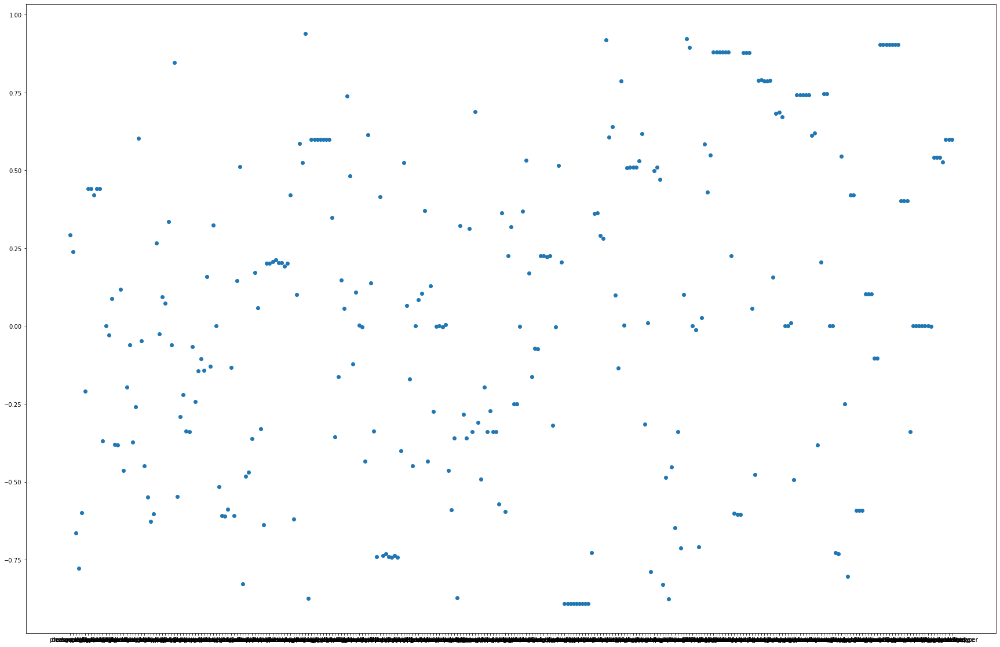

In [312]:
x,y = zip(*topic_sentiment_mean.items())
figure = plt.figure(figsize=(30,20))
plt.scatter(x,y)

In [338]:
pos_by_mean = [x for x in topic_sentiment_mean.keys() if topic_sentiment_mean[x] > 0.05]
neg_by_mean = [x for x in topic_sentiment_mean.keys() if topic_sentiment_mean[x] < -0.05]

In [325]:
topic_sentiment_result_mean_score_df = pd.DataFrame.from_dict(topic_sentiment_mean,orient='index')
topic_sentiment_result_mean_score_df.columns = ['mean_score']

topic_sentiment_result_mean_score_df['sentiment_result'] = 'neu'
topic_sentiment_result_mean_score_df.loc[topic_sentiment_result_mean_score_df.mean_score > 0.05, 'sentiment_result'] = 'pos'
topic_sentiment_result_mean_score_df.loc[topic_sentiment_result_mean_score_df.mean_score < -0.05, 'sentiment_result'] = 'neg'

topic_sentiment_result_mean_score_df.head()

,mean_score,sentiment_result
democracy act,0.252135,pos
human right,0.297226,pos
one man,-0.640162,neg
anglo face,-0.778300,neg
vasco williams,-0.665770,neg


#### By median score

In [344]:
topic_sentiment_median = {}
topic_sentiment_median_distribution = {} # topic: [pos_count, neu_count, neg_count]
for topic, scores in topic_sentiment.items():
    topic_sentiment_median[topic] = np.median(scores)
    pos = [x for x in scores if x > 0.05]
    neu = [x for x in scores if x >= -0.05 and x  <= 0.05]
    neg = [x for x in scores if x < -0.05]
    
    topic_sentiment_median_distribution[topic] = [len(pos),len(neu),len(neg)]

pos_by_median = [x for x in topic_sentiment_median.keys() if topic_sentiment_median[x] > 0.05]
neg_by_median = [x for x in topic_sentiment_median.keys() if topic_sentiment_median[x] < -0.05]

topic_sentiment_result_median_score_df = pd.DataFrame.from_dict(topic_sentiment_median,orient='index')
topic_sentiment_result_median_score_df.columns = ['median_score']

topic_sentiment_result_median_score_df['sentiment_result'] = 'neu'
topic_sentiment_result_median_score_df.loc[topic_sentiment_result_median_score_df.median_score > 0.05, 'sentiment_result'] = 'pos'
topic_sentiment_result_median_score_df.loc[topic_sentiment_result_median_score_df.median_score < -0.05, 'sentiment_result'] = 'neg'

#### By Sentiment of tweets of the highest proportion

In [326]:
topic_sentiment_distribution = {}
for topic in topic_sentiment.keys():
    topic_sentiment_distribution[topic] = {}
    topic_sentiment_distribution[topic]['pos'] = len([x for x in topic_sentiment[topic] if x>0.05  ])
    topic_sentiment_distribution[topic]['neu'] = len([x for x in topic_sentiment[topic] if x<=0.05 and x>=-0.05 ])
    topic_sentiment_distribution[topic]['neg'] = len([x for x in topic_sentiment[topic] if x<-0.05  ])
topic_sentiment_distribution

{'democracy act': {'pos': 647, 'neu': 290, 'neg': 183},
 'human right': {'pos': 2501, 'neu': 347, 'neg': 1020},
 'one man': {'pos': 2, 'neu': 1, 'neg': 34},
 'anglo face': {'pos': 0, 'neu': 0, 'neg': 24},
 'vasco williams': {'pos': 4, 'neu': 3, 'neg': 37},
 'great possibility': {'pos': 76, 'neu': 0, 'neg': 0},
 'totally independent': {'pos': 76, 'neu': 0, 'neg': 0},
 'jurisdictional claim': {'pos': 76, 'neu': 0, 'neg': 0},
 'country totally': {'pos': 76, 'neu': 0, 'neg': 0},
 'even imagine': {'pos': 77, 'neu': 0, 'neg': 2},
 'police officer': {'pos': 277, 'neu': 61, 'neg': 950},
 'past weekend': {'pos': 27, 'neu': 0, 'neg': 0},
 'country two': {'pos': 15, 'neu': 5, 'neg': 29},
 'carrie lam': {'pos': 284, 'neu': 134, 'neg': 2039},
 'year ago': {'pos': 279, 'neu': 7, 'neg': 26},
 'yuen long': {'pos': 35, 'neu': 88, 'neg': 608},
 'mtr station': {'pos': 218, 'neu': 86, 'neg': 327},
 'lennon wall': {'pos': 185, 'neu': 63, 'neg': 166},
 'tear gas': {'pos': 490, 'neu': 623, 'neg': 2624},
 'ru

In [327]:
topic_sentiment_result_df = pd.DataFrame.from_dict(topic_sentiment_distribution,orient='index')
topic_sentiment_result_df.columns = ['pos','neu','neg']
topic_sentiment_result_df.head()

,pos,neu,neg
absolutely timely,110,0,0
allege sexual,0,0,390
anglo face,0,0,24
another right,0,0,102
antimask law,0,3,3


In [328]:
topic_sentiment_result_proportion_df = topic_sentiment_result_df.copy()
topic_sentiment_result_proportion_df['total'] = topic_sentiment_result_proportion_df.sum(axis=1)
topic_sentiment_result_proportion_df = topic_sentiment_result_proportion_df.iloc[:,:3].div(topic_sentiment_result_proportion_df['total'],axis=0)*100
topic_sentiment_result_proportion_df.head()

,pos,neu,neg
absolutely timely,100.0,0.0,0.0
allege sexual,0.0,0.0,100.0
anglo face,0.0,0.0,100.0
another right,0.0,0.0,100.0
antimask law,0.0,50.0,50.0


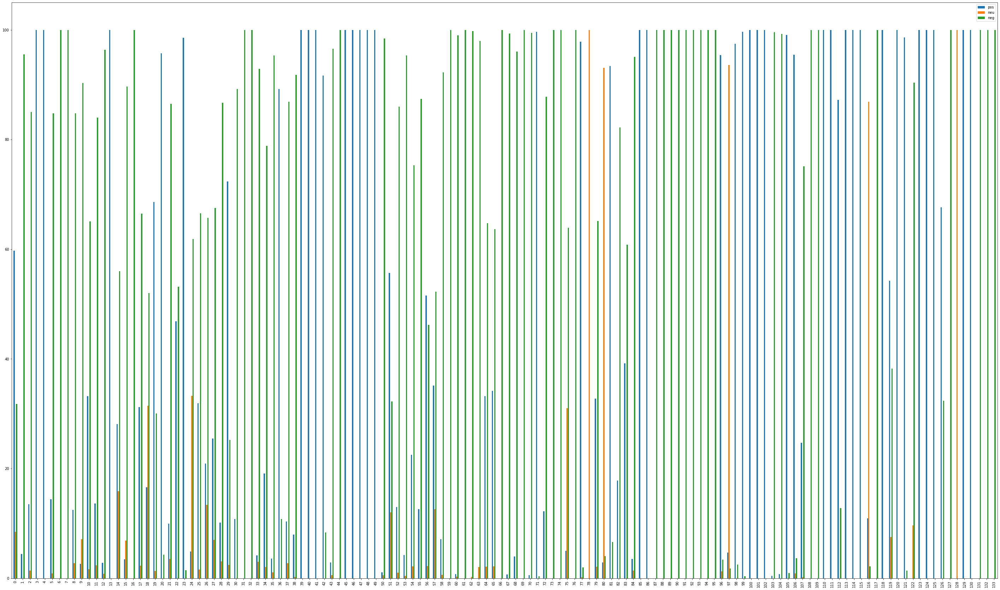

In [328]:
#topic_sentiment_result_proportion_df.reset_index().plot(kind='bar',figsize=(50,30))

In [81]:
topic_sentiment_result_proportion_df.to_csv('sample_topic_tweet_sentiment_proportion.csv')

In [329]:
topic_sentiment_result_proportion_df['dominant'] = topic_sentiment_result_proportion_df.idxmax(axis=1)

#### Analyse topics

In [353]:
topic_sentiment_result_proportion_df.groupby('dominant').count()[['pos']]

,pos
dominant,
neg,103
neu,27
pos,126


In [87]:
topic_sentiment_result_mean_score_df.groupby('sentiment_result').count()

,mean_score
sentiment_result,
neg,103
neu,29
pos,124


In [346]:
topic_sentiment_result_median_score_df.groupby('sentiment_result').count()

,median_score
sentiment_result,
neg,100
neu,36
pos,120


In [355]:
topic_sentiment_count_overall =topic_sentiment_result_proportion_df.groupby('dominant').count()[['pos']]
topic_sentiment_count_overall.columns = ['topic count by proportion']

topic_sentiment_count_overall = topic_sentiment_count_overall.join(topic_sentiment_result_mean_score_df.groupby('sentiment_result').count())
topic_sentiment_count_overall = topic_sentiment_count_overall.join(topic_sentiment_result_median_score_df.groupby('sentiment_result').count())
topic_sentiment_count_overall

,topic count by proportion,mean_score,median_score
dominant,,,
neg,103,103,100
neu,27,27,36
pos,126,126,120


In [334]:
pos_by_propotion = topic_sentiment_result_proportion_df[topic_sentiment_result_proportion_df.dominant=='pos'].index
neg_by_propotion= topic_sentiment_result_proportion_df[topic_sentiment_result_proportion_df.dominant=='neg'].index

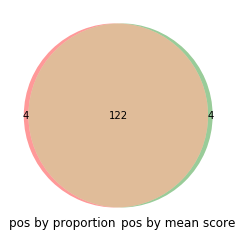

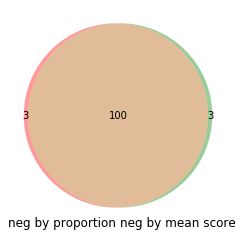

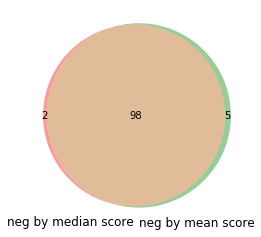

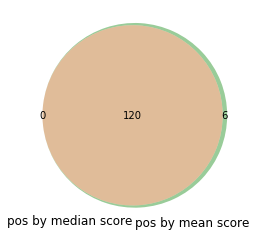

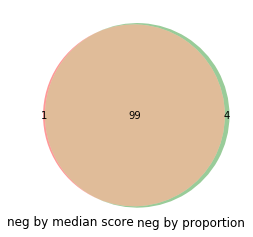

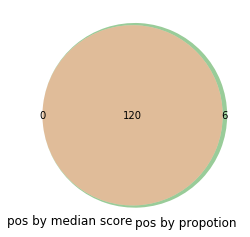

In [358]:
from matplotlib_venn import venn2

# ax, figure = plt.subplots(nrows=2,ncols=1)
# First way to call the 2 group Venn diagram:
venn2(subsets = (set(pos_by_propotion), set(pos_by_mean)), set_labels = ('pos by proportion', 'pos by mean score'))
plt.show()

# First way to call the 2 group Venn diagram:
venn2(subsets = (set(neg_by_propotion), set(neg_by_mean)), set_labels = ('neg by proportion', 'neg by mean score'))
plt.show()


venn2(subsets = (set(neg_by_median), set(neg_by_mean)), set_labels = ('neg by median score', 'neg by mean score'))
plt.show()


venn2(subsets = (set(pos_by_median), set(pos_by_mean)), set_labels = ('pos by median score', 'pos by mean score'))
plt.show()

venn2(subsets = (set(neg_by_median), set(neg_by_propotion)), set_labels = ('neg by median score', 'neg by proportion'))
plt.show()

venn2(subsets = (set(pos_by_median), set(pos_by_propotion)), set_labels = ('pos by median score', 'pos by propotion'))
plt.show()


In [336]:
controversial_topics = set([x for x in pos_by_propotion if x not in pos_by_mean] + [x for x in pos_by_mean if x not in pos_by_propotion] + [x for x in neg_by_propotion if x not in neg_by_mean] + [x for x in neg_by_mean if x not in neg_by_propotion]) 
controversial_topics_sentiment = {}

for topic in set([x for x in pos_by_propotion if x not in pos_by_mean] + [x for x in pos_by_mean if x not in pos_by_propotion] + [x for x in neg_by_propotion if x not in neg_by_mean] + [x for x in neg_by_mean if x not in neg_by_propotion]):
    # [by proportion, by mean score]
    controversial_topics_sentiment[topic] = {}
    controversial_topics_sentiment[topic]['by-proportion'] = topic_sentiment_result_proportion_df.loc[topic,'dominant']
    
    controversial_topics_sentiment[topic]['by-mean'] = topic_sentiment_result_mean_score_df.loc[topic,'sentiment_result']

controversial_topics_result = pd.DataFrame.from_dict(controversial_topics_sentiment,orient='index')
controversial_topics_result

,by-proportion,by-mean
antimask law,neu,neg
deliberately target,neu,pos
lennon wall,pos,neu
mask ban,pos,neg
national day,pos,neu
nets game,neu,pos
pan away,neg,pos
police force,pos,neg
tweet support,neg,pos
water cannon,neg,neu


In [91]:
controversial_topics_result_details = topic_sentiment_result_proportion_df.loc[topic_sentiment_result_proportion_df.index.isin(controversial_topics_sentiment.keys())].join(topic_sentiment_result_mean_score_df.loc[topic_sentiment_result_mean_score_df.index.isin(controversial_topics_sentiment.keys())])
controversial_topics_result_details

,pos,neu,neg,dominant,mean_score,sentiment_result
antimask law,0.000000,50.000000,50.000000,neu,-0.222467,neg
deliberately target,17.180617,79.295154,3.524229,neu,0.064370,pos
lennon wall,44.685990,15.217391,40.096618,pos,-0.028247,neu
mask ban,49.855072,0.579710,49.565217,pos,-0.196705,neg
national day,47.920434,5.424955,46.654611,pos,-0.014471,neu
nets game,10.382514,87.431694,2.185792,neu,0.057832,pos
pan away,38.321995,0.000000,61.678005,neg,0.160411,pos
police force,47.058824,10.252101,42.689076,pos,-0.055159,neg
tweet support,39.639640,0.000000,60.360360,neg,0.168381,pos
water cannon,41.807658,13.490650,44.701692,neg,-0.008505,neu


In [333]:
topic_sentiment_ids = {
    topic: {'pos':[],'neg':[],'neu':[]}
    for topic in topic_sentiment_result_mean_score_df.index
}

for id,tweet,score in df_sa_tweet[['id','sentiment_tweets','compound']].itertuples(index=False):
    for topic in pop_topic_all_bigram:
        if topic in tweet:
            if score > 0.05:           
                topic_sentiment_ids[topic]['pos'].append((id,score))
            elif score < -0.05:           
                topic_sentiment_ids[topic]['neg'].append((id,score))
            else:
                topic_sentiment_ids[topic]['neu'].append((id,score))

{'whiskers': [<matplotlib.lines.Line2D at 0x1c2bc800c50>,
 'caps': [<matplotlib.lines.Line2D at 0x1c2bc833a58>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c2bc7dfe48>],
 'medians': [<matplotlib.lines.Line2D at 0x1c2bd35efd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c2bd36f550>],
 'means': [<matplotlib.lines.Line2D at 0x1c2bd36fa90>]}

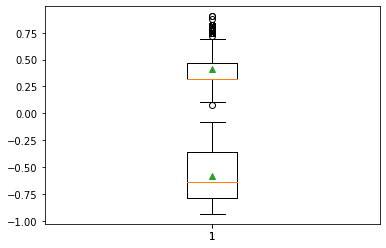

In [94]:
plt.boxplot([x[1] for x in topic_sentiment_ids['police force']['pos']],showmeans=True)
plt.boxplot([x[1] for x in topic_sentiment_ids['police force']['neg']],showmeans=True)

In [359]:
pickle.dump(df_sa_tweet,open('data/sample tweet for sentiment analysis.p','wb'))

In [360]:
pos_by_mean

['democracy act',
 'human right',
 'great possibility',
 'totally independent',
 'jurisdictional claim',
 'country totally',
 'even imagine',
 'past weekend',
 'year ago',
 'one day',
 'two systems',
 'one country',
 'last night',
 'god bless',
 'communist party',
 'protest anthem',
 'seem every',
 'joint declaration',
 'east asia',
 'passport holder',
 'unanimously pass',
 'passage come',
 'critical time',
 'pass senator',
 'senator marco',
 'absolutely timely',
 'mean nothing',
 'kwun tong',
 'make clear',
 'european clean',
 'hearing title',
 'international cybersecurity',
 'securing freedom',
 'chair subcommittee',
 'get back',
 'chater garden',
 'basic law',
 'would love',
 'first hand',
 'blue dye',
 'rally last',
 'warrant card',
 'freedom stand',
 'take away',
 'support free',
 'deliberately target',
 'sha tsui',
 'tsim sha',
 'ethnic minority',
 'support hongkongers',
 'chinese govt',
 'ncm yue',
 'really need',
 'speaker blast',
 'protester use',
 'tweet support',
 'see call'

In [361]:
neg_by_mean

['one man',
 'anglo face',
 'vasco williams',
 'police officer',
 'country two',
 'carrie lam',
 'yuen long',
 'mtr station',
 'tear gas',
 'rubber bullet',
 'chief exec',
 'edinburgh place',
 'would happen',
 'body find',
 'dead body',
 'police force',
 'first aider',
 'wear black',
 'pepper spray',
 'young man',
 'police pull',
 'five demand',
 'police station',
 'stand news',
 'mong kok',
 'full story',
 'youngster wait',
 'even wear',
 'arbitrarily arrest',
 'wait bus',
 'police last',
 'price edward',
 'sexual assault',
 'civil human',
 'jimmy sham',
 'sha tin',
 'riot police',
 'tseung kwan',
 'sexual violence',
 'right eye',
 'causeway bay',
 'police fire',
 'take bus',
 'ask police',
 'legislator chu',
 'officer suddenly',
 'sprayed legislator',
 'suddenly pepper',
 'pepper sprayed',
 'close range',
 'face mask',
 'dont know',
 'old lady',
 'people protest',
 'nathan road',
 'live round',
 'point blank',
 'live ammunition',
 'violently arrest',
 'get shoot',
 'protester get',
 

### By topic by time

In [601]:
df_sa_tweet_time

,id,text,sentiment_tweets,polarity_score,compound,sentiment_result,weekday,date,time
0,1176408764590829570,Fringe practicing wanton destruction for destr...,fringe practice wanton destruction for destruc...,"{'neg': 0.292, 'neu': 0.593, 'pos': 0.115, 'co...",-0.6705,neg,Tue,24/09/2019,08:11:20
1,1176408776959643648,In this battle between democracy versus dictat...,in this battle between democracy versus dictat...,"{'neg': 0.076, 'neu': 0.762, 'pos': 0.161, 'co...",0.4404,pos,Tue,24/09/2019,08:11:23
2,1176408806890147840,If this #VascoWilliams guy isn’t unemployed in...,"if this guy be n't unemployed in 48 hr , shoul...","{'neg': 0.227, 'neu': 0.721, 'pos': 0.052, 'co...",-0.7783,neg,Tue,24/09/2019,08:11:30
3,1176408832714559489,I cosponsored the #HongKongHumanRightsAndDemoc...,i cosponsor the to support pro-democracy prote...,"{'neg': 0.034, 'neu': 0.656, 'pos': 0.31, 'com...",0.9217,pos,Tue,24/09/2019,08:11:36
4,1176408868395479042,"Also when #HKPolice say ""nothing is more impor...",also when say `` nothing be more important tha...,"{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'comp...",-0.6342,neg,Tue,24/09/2019,08:11:45
5,1176408875785809922,"⚠️ The “#YellowObject” ⚠️\n\nFrom #Rawanda, we...",warning️ the warning️ from we know dehumanizat...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,neu,Tue,24/09/2019,08:11:47
6,1176408882534473728,My @amnesty colleagues spent months working on...,my colleague spend month work on this importan...,"{'neg': 0.103, 'neu': 0.718, 'pos': 0.179, 'co...",0.2500,pos,Tue,24/09/2019,08:11:48
7,1176408884031848448,Video: 'Protect Our Kids' protest group says v...,video : 'protect our kids ' protest group say ...,"{'neg': 0.114, 'neu': 0.739, 'pos': 0.148, 'co...",0.1531,pos,Tue,24/09/2019,08:11:49
8,1176408885185277952,If this #VascoWilliams guy isn’t unemployed in...,"if this guy be n't unemployed in 48 hr , shoul...","{'neg': 0.227, 'neu': 0.721, 'pos': 0.052, 'co...",-0.7783,neg,Tue,24/09/2019,08:11:49
9,1176408898854502400,Important dates and events of #HongKong #AntiE...,important date and event of movement mark on a...,"{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'comp...",0.2714,pos,Tue,24/09/2019,08:11:52


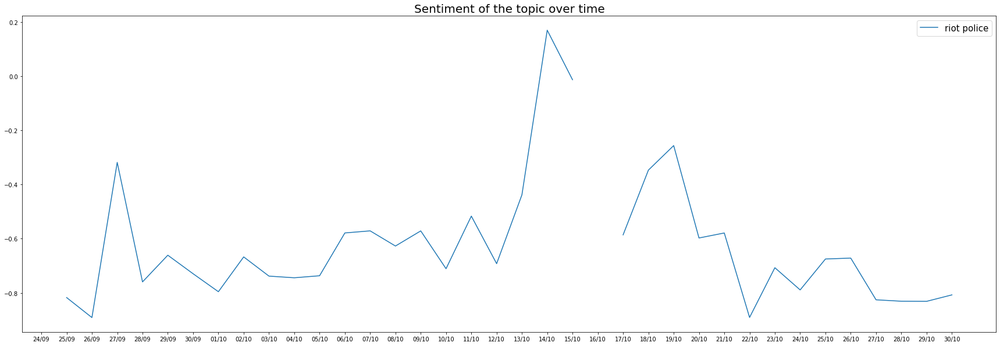

In [690]:
dates = time_pop_words_bigram_freq_selected.keys()
legend = []

fig = plt.figure(figsize=(30,10))

for word in all_topic_words:
    dates_sentiment = []
    for date in dates:
        dates_sentiment.append(np.mean(
            df_sa_tweet_time[(df_sa_tweet_time.sentiment_tweets.str.contains(word))&(df_sa_tweet_time.date==date)]['compound']
        ))
        
    
    
    if word == 'riot police':
        plt.plot(list([x[:5] for x in dates]),dates_sentiment)
        legend.append(word)
plt.title("Sentiment of the topic over time",fontsize=20)
plt.legend(legend,fontsize=15)
plt.savefig('prez-img/sentiment_topic_time.png',dpi=100)
plt.show()


In [685]:
communities

{0: ['human rights', 'communist party', 'democracy act', 'ncm yue'],
 1: ['tear gas',
  'riot police',
  'pepper spray',
  'police officer',
  'warrant card',
  'police fire',
  'antimask law',
  'mtr station',
  'mong kok',
  'old lady'],
 2: ['carrie lam', '官逼民反 oppressive'],
 3: ['water cannon', 'kowloon mosque'],
 4: ['world deescalate'],
 5: ['police pull']}

## Combine Sentiment & Word Cloud

In [532]:
# credit: https://amueller.github.io/word_cloud/auto_examples/colored_by_group.html
from wordcloud import (WordCloud, get_single_color_func)
import requests
class SimpleGroupedColorFunc(object):
    """Create a color function object which assigns EXACT colors
       to certain words based on the color to words mapping

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}

        self.default_color = default_color

    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)

class GroupedColorFunc(object):
    """Create a color function object which assigns DIFFERENT SHADES of
       specified colors to certain words based on the color to words mapping.

       Uses wordcloud.get_single_color_func

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.color_func_to_words = [
            (get_single_color_func(color), set(words))
            for (color, words) in color_to_words.items()]

        self.default_color_func = get_single_color_func(default_color)

    def get_color_func(self, word):
        """Returns a single_color_func associated with the word"""
        try:
            color_func = next(
                color_func for (color_func, words) in self.color_func_to_words
                if word in words)
        except StopIteration:
            color_func = self.default_color_func

        return color_func

    def __call__(self, word, **kwargs):
        return self.get_color_func(word)(word, **kwargs)

# Source of positive and negative words
# Minqing Hu and Bing Liu. "Mining and Summarizing Customer Reviews." 
#        Proceedings of the ACM SIGKDD International Conference on Knowledge 
#        Discovery and Data Mining (KDD-2004), Aug 22-25, 2004, Seattle, 
#        Washington, USA, 
# Bing Liu, Minqing Hu and Junsheng Cheng. "Opinion Observer: Analyzing 
#        and Comparing Opinions on the Web." Proceedings of the 14th 
#        International World Wide Web conference (WWW-2005), May 10-14, 
#        2005, Chiba, Japan.

neg_word_text = requests.get('http://ptrckprry.com/course/ssd/data/negative-words.txt').text
neg_word_list = neg_word_text.split(';;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;')[2].split('\n')
neg_word_list = [x for x in word_list if x != '']


pos_word_text = requests.get('http://ptrckprry.com/course/ssd/data/positive-words.txt').text
pos_word_list = pos_word_text.split(';;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;')[2].split('\n')
pos_word_list = [x for x in word_list if x != '']

color_to_words = {
    # words below will be colored with a green single color function
    '#00ff00': list(topic_sentiment_result_proportion_df[topic_sentiment_result_proportion_df.dominant=='pos'].index)+pos_word_list,
    # will be colored with a red single color function
    'red': list(topic_sentiment_result_proportion_df[topic_sentiment_result_proportion_df.dominant=='neg'].index)+neg_word_list
}
default_color = 'grey'

grouped_color_func = GroupedColorFunc(color_to_words, default_color)

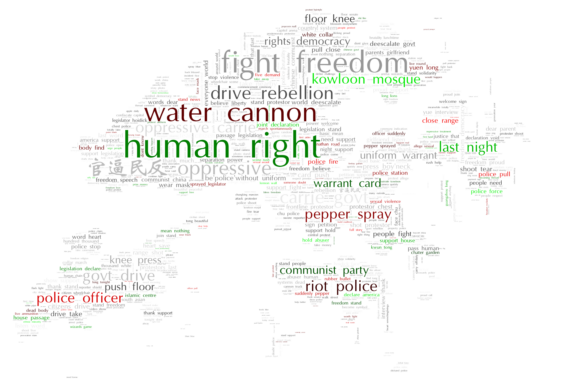

In [534]:
# Overall 
all_words = []
word_list = ['hong','kong','hongkong','hk','hong kong','ers','amp','sha','tsui','tsim',"n't"]
for phrases in df_wc_tweet.without_hashtags:
    phrases = phrases.split()
    selected = []
    for phrase in phrases:
        if phrase not in stop_words and not check_phrase_in_list(phrase,word_list) and len(phrase)>3:
            selected.append(phrase) 
    all_words.extend(selected)
#'sample_tweet_without_hastag_bigram_color_words_by_sentiment.jpg'
generate_word_cloud(all_words,'sample_tweet_without_hastag_bigram_color_words_by_sentiment.jpg',bigram=True,re_color=True)

# Test